In [ ]:
import requests
import zipfile
import io
import os
import pandas as pd

zip_file_url = "https://archive.ics.uci.edu/static/public/501/beijing+multi+site+air+quality+data.zip"
r = requests.get(zip_file_url)

z = zipfile.ZipFile(io.BytesIO(r.content))
z.extract("PRSA2017_Data_20130301-20170228.zip","/content/")

f = zipfile.ZipFile("/content/PRSA2017_Data_20130301-20170228.zip")
f.extractall("/content/")

try:
    os.remove("/content/PRSA2017_Data_20130301-20170228.zip")
except:
    print("No zip file to remove")

os.chdir("/content/PRSA_Data_20130301-20170228")

print("Previous File Names:")
for data_file in os.listdir(os.getcwd()):
    print('\t' + data_file)
    file_name = list(data_file.split('_'))
    os.rename(data_file, str(file_name[2])+'.csv')




Previous File Names:
	PRSA_Data_Gucheng_20130301-20170228.csv
	PRSA_Data_Dongsi_20130301-20170228.csv
	PRSA_Data_Guanyuan_20130301-20170228.csv
	PRSA_Data_Wanshouxigong_20130301-20170228.csv
	PRSA_Data_Tiantan_20130301-20170228.csv
	PRSA_Data_Changping_20130301-20170228.csv
	PRSA_Data_Wanliu_20130301-20170228.csv
	PRSA_Data_Shunyi_20130301-20170228.csv
	PRSA_Data_Dingling_20130301-20170228.csv
	PRSA_Data_Nongzhanguan_20130301-20170228.csv
	PRSA_Data_Aotizhongxin_20130301-20170228.csv
	PRSA_Data_Huairou_20130301-20170228.csv


In [ ]:
print("New File Names:")
file_url_list = []
for file_name in os.listdir(os.getcwd()):
    print("\t" + file_name)
    file_url_list.append(os.getcwd()+'/'+file_name)



New File Names:
	Shunyi.csv
	Wanliu.csv
	Changping.csv
	Dingling.csv
	Guanyuan.csv
	Dongsi.csv
	Aotizhongxin.csv
	Nongzhanguan.csv
	Wanshouxigong.csv
	Gucheng.csv
	Huairou.csv
	Tiantan.csv


In [ ]:
df_0 = pd.read_csv(file_url_list[0])
df_0.drop(columns=['No'], inplace=True)
df_0

,year,month,day,hour,PM2.5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,wd,WSPM,station
0,2013,3,1,0,3.0,6.0,3.0,8.0,300.0,44.0,-0.9,1025.8,-20.5,0.0,NW,9.3,Shunyi
1,2013,3,1,1,12.0,12.0,3.0,7.0,300.0,47.0,-1.1,1026.1,-21.3,0.0,NW,9.4,Shunyi
2,2013,3,1,2,14.0,14.0,NaN,7.0,200.0,22.0,-1.7,1026.2,-23.0,0.0,NW,8.6,Shunyi
3,2013,3,1,3,12.0,12.0,3.0,5.0,NaN,NaN,-2.1,1027.3,-23.3,0.0,NW,6.6,Shunyi
4,2013,3,1,4,12.0,12.0,3.0,NaN,200.0,11.0,-2.4,1027.7,-22.9,0.0,NW,4.5,Shunyi
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
35059,2017,2,28,19,27.0,72.0,8.0,92.0,800.0,16.0,10.3,1014.2,-12.4,0.0,W,1.8,Shunyi
35060,2017,2,28,20,47.0,55.0,17.0,86.0,1100.0,19.0,9.8,1014.5,-9.9,0.0,NW,1.5,Shunyi
35061,2017,2,28,21,18.0,28.0,4.0,30.0,500.0,64.0,9.1,1014.6,-12.7,0.0,NE,1.7,Shunyi
35062,2017,2,28,22,18.0,20.0,9.0,33.0,500.0,59.0,7.1,1015.2,-13.2,0.0,WNW,1.8,Shunyi


In [ ]:
df_0['timestamp'] = pd.to_datetime(df_0[["year", "month", "day", "hour"]])
df_0 = df_0.sort_values(by="timestamp").reset_index(drop=True)

In [ ]:
df_0.drop(columns=['year', 'month', 'day', 'hour', 'station'], inplace=True)

In [ ]:
df_0[df_0[['TEMP', 'PRES', 'DEWP', 'RAIN', 'wd', 'WSPM']].isna().any(axis=1)]

,PM2.5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,wd,WSPM,timestamp
2906,159.0,133.0,3.0,65.0,2299.0,2.0,21.8,1000.8,NaN,0.0,WNW,0.0,2013-06-30 02:00:00
2907,148.0,126.0,3.0,60.0,2399.0,2.0,21.5,1000.7,NaN,0.0,ESE,0.0,2013-06-30 03:00:00
2908,134.0,111.0,3.0,51.0,2399.0,2.0,21.5,1001.4,NaN,0.0,S,0.8,2013-06-30 04:00:00
6764,380.0,378.0,44.0,121.0,8500.0,4.0,-0.1,1016.7,-2.2,0.0,NaN,0.1,2013-12-07 20:00:00
16416,215.0,215.0,36.0,86.0,2800.0,17.0,-4.0,1027.9,-8.1,0.0,NaN,0.9,2015-01-14 00:00:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...
34872,NaN,NaN,NaN,NaN,NaN,NaN,-3.2,1030.6,-13.2,0.0,NaN,0.2,2017-02-21 00:00:00
34903,82.0,82.0,4.0,56.0,1600.0,8.0,-3.4,1018.3,-5.3,0.0,NaN,0.1,2017-02-22 07:00:00
34944,74.0,80.0,30.0,102.0,2100.0,2.0,-1.1,1022.8,-9.2,0.0,NaN,0.2,2017-02-24 00:00:00
34946,71.0,86.0,24.0,99.0,2200.0,2.0,-2.3,1023.0,-8.0,0.0,NaN,0.0,2017-02-24 02:00:00


In [ ]:
# import pandas as pd
# import matplotlib.pyplot as plt

# # Assuming df is your pandas DataFrame containing the dataset
# # You can load your dataset using pd.read_csv() or any other appropriate method

# # Check for missing values
# missing_values = df_0.isnull().sum()

# # Calculate the percentage of missing values for each variable
# missing_percentage = (missing_values / len(df_0)) * 100

# # Create a DataFrame to store missing value information
# missing_info = pd.DataFrame({'Missing Values': missing_values, 'Percentage': missing_percentage})
# missing_info.sort_values(by='Percentage', ascending=False, inplace=True)

# # Plot missing values
# plt.figure(figsize=(10, 6))
# missing_info['Percentage'].plot(kind='bar', color='skyblue')
# plt.title('Percentage of Missing Values by Variable')
# plt.xlabel('Variables')
# plt.ylabel('Percentage of Missing Values')
# plt.xticks(rotation=45)
# plt.tight_layout()
# plt.show()

# # Analyze patterns of missingness
# # You can further investigate patterns of missingness using techniques like heatmap or correlation
# # For example, you can use df.corr() to compute correlation between missing values of different variables
# # And visualize it using seaborn's heatmap

# # Example:
# # import seaborn as sns
# # plt.figure(figsize=(10, 8))
# # sns.heatmap(df.isnull(), cmap='viridis')
# # plt.title('Missing Values Heatmap')
# # plt.show()

# # Determine if missing values are random or systematic
# # Analyzing patterns of missingness and understanding the context of data collection can help determine whether missing values are random or systematic
# # Random missing values might occur due to measurement errors or data entry mistakes, while systematic missing values might be related to the data collection process or underlying phenomena
# # Strategies for handling missing values depend on the nature of missingness and the specific context of the data


In [ ]:
# Function to replace NaN values with the average of the non-NaN values above and below
def replace_nan_with_average(series):
    for i in range(1, len(series) - 1):
        if pd.isna(series[i]):
            start_index = i - 1
            end_index = i + 1
            while end_index < len(series) and pd.isna(series[end_index]):
                end_index += 1
            if end_index == len(series):
                end_index -= 1
        series.interpolate(method='linear', inplace=True)
    return series

# Apply the function to the 'value' column
df_0['CO'] = replace_nan_with_average(df_0['CO'])

In [ ]:
df_0.dropna(inplace=True)
df_0.reset_index(drop=True, inplace=True)
df_0

,PM2.5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,wd,WSPM,timestamp
0,3.0,6.0,3.0,8.0,300.0,44.0,-0.9,1025.8,-20.5,0.0,NW,9.3,2013-03-01 00:00:00
1,12.0,12.0,3.0,7.0,300.0,47.0,-1.1,1026.1,-21.3,0.0,NW,9.4,2013-03-01 01:00:00
2,11.0,11.0,3.0,7.0,200.0,45.0,-2.8,1028.2,-22.1,0.0,NNW,1.7,2013-03-01 05:00:00
3,12.0,12.0,3.0,9.0,300.0,74.0,-4.0,1029.0,-21.2,0.0,NNE,1.6,2013-03-01 06:00:00
4,13.0,13.0,3.0,23.0,300.0,59.0,-2.4,1030.5,-21.3,0.0,NE,1.7,2013-03-01 07:00:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...
31095,27.0,72.0,8.0,92.0,800.0,16.0,10.3,1014.2,-12.4,0.0,W,1.8,2017-02-28 19:00:00
31096,47.0,55.0,17.0,86.0,1100.0,19.0,9.8,1014.5,-9.9,0.0,NW,1.5,2017-02-28 20:00:00
31097,18.0,28.0,4.0,30.0,500.0,64.0,9.1,1014.6,-12.7,0.0,NE,1.7,2017-02-28 21:00:00
31098,18.0,20.0,9.0,33.0,500.0,59.0,7.1,1015.2,-13.2,0.0,WNW,1.8,2017-02-28 22:00:00


In [ ]:
import pandas as pd
import numpy as np
df = df_0
# Assuming df is your pandas DataFrame containing the dataset
# You can load your dataset using pd.read_csv() or any other appropriate method

# Select only numeric columns for computing summary statistics
numeric_cols = df.select_dtypes(include=[np.number])

# Compute summary statistics
summary_stats = numeric_cols.describe()

# Transpose the summary statistics for better readability
summary_stats = summary_stats.T

# Add additional statistics like median, quartiles, etc.
summary_stats['median'] = numeric_cols.median()
summary_stats['1st quartile'] = numeric_cols.quantile(0.25)
summary_stats['3rd quartile'] = numeric_cols.quantile(0.75)

# Print the summary statistics
print(summary_stats)


         count         mean          std       min     25%     50%     75%  \
PM2.5  31100.0    79.245241    81.492876    2.0000    19.0    54.0   111.0   
PM10   31100.0    99.144428    89.973374    2.0000    31.0    77.0   139.0   
SO2    31100.0    13.981728    19.958511    0.2856     2.0     5.0    17.0   
NO2    31100.0    44.407718    30.965834    2.0000    20.0    38.0    63.0   
CO     31100.0  1202.186076  1161.331577  100.0000   400.0   900.0  1500.0   
O3     31100.0    55.270282    54.191037    0.2142    11.0    44.0    77.0   
TEMP   31100.0    12.942435    11.493197  -16.8000     2.6    13.5    22.9   
PRES   31100.0  1013.481529    10.158541  988.0000  1005.1  1013.2  1021.5   
DEWP   31100.0     1.755331    13.724698  -36.0000    -9.5     1.8    14.4   
RAIN   31100.0     0.055051     0.709264    0.0000     0.0     0.0     0.0   
WSPM   31100.0     1.840608     1.292341    0.0000     1.0     1.5     2.3   

           max  median  1st quartile  3rd quartile  
PM2.5    7

In [ ]:
summary_stat_df = pd.DataFrame(summary_stats)
summary_stat_df

,count,mean,std,min,25%,50%,75%,max,median,1st quartile,3rd quartile
PM2.5,31100.0,79.245241,81.492876,2.0000,19.0,54.0,111.0,762.0,54.0,19.0,111.0
PM10,31100.0,99.144428,89.973374,2.0000,31.0,77.0,139.0,999.0,77.0,31.0,139.0
SO2,31100.0,13.981728,19.958511,0.2856,2.0,5.0,17.0,207.0,5.0,2.0,17.0
NO2,31100.0,44.407718,30.965834,2.0000,20.0,38.0,63.0,258.0,38.0,20.0,63.0
CO,31100.0,1202.186076,1161.331577,100.0000,400.0,900.0,1500.0,10000.0,900.0,400.0,1500.0
O3,31100.0,55.270282,54.191037,0.2142,11.0,44.0,77.0,340.0,44.0,11.0,77.0
TEMP,31100.0,12.942435,11.493197,-16.8000,2.6,13.5,22.9,39.0,13.5,2.6,22.9
PRES,31100.0,1013.481529,10.158541,988.0000,1005.1,1013.2,1021.5,1042.8,1013.2,1005.1,1021.5
DEWP,31100.0,1.755331,13.724698,-36.0000,-9.5,1.8,14.4,27.5,1.8,-9.5,14.4
RAIN,31100.0,0.055051,0.709264,0.0000,0.0,0.0,0.0,37.3,0.0,0.0,0.0


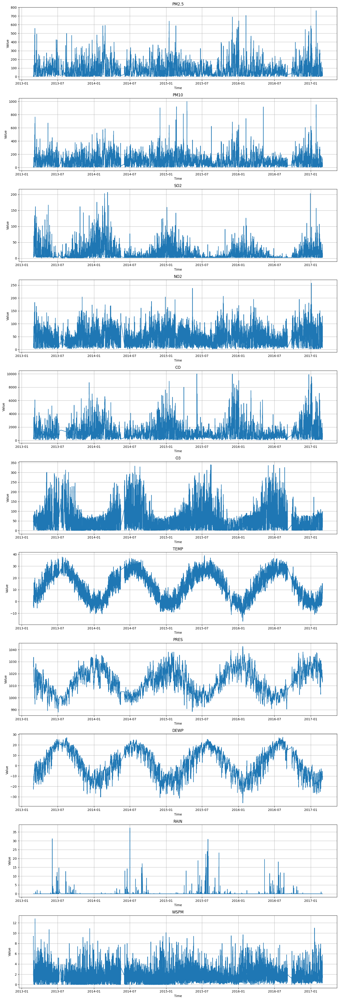

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Assuming df is your pandas DataFrame containing the dataset
# You can load your dataset using pd.read_csv() or any other appropriate method
# Make sure your DataFrame has a 'timestamp' column representing the time
df = df_0
# Convert the 'timestamp' column to datetime format if it's not already in datetime
df['timestamp'] = pd.to_datetime(df['timestamp'])

# Set the 'timestamp' column as the index of the DataFrame
df.set_index('timestamp', inplace=True)

# Select pollutant concentration and meteorological variables for analysis
variables_of_interest = ['PM2.5', 'PM10', 'SO2', 'NO2', 'CO', 'O3', 'TEMP', 'PRES', 'DEWP', 'RAIN', 'WSPM']

# Plot time series graphs for each variable in separate subplots
num_plots = len(variables_of_interest)
fig, axes = plt.subplots(num_plots, 1, figsize=(15, 4*num_plots))

for i, variable in enumerate(variables_of_interest):
    axes[i].plot(df.index, df[variable])
    axes[i].set_title(variable)
    axes[i].set_xlabel('Time')
    axes[i].set_ylabel('Value')
    axes[i].grid(True)

plt.tight_layout()
plt.show()


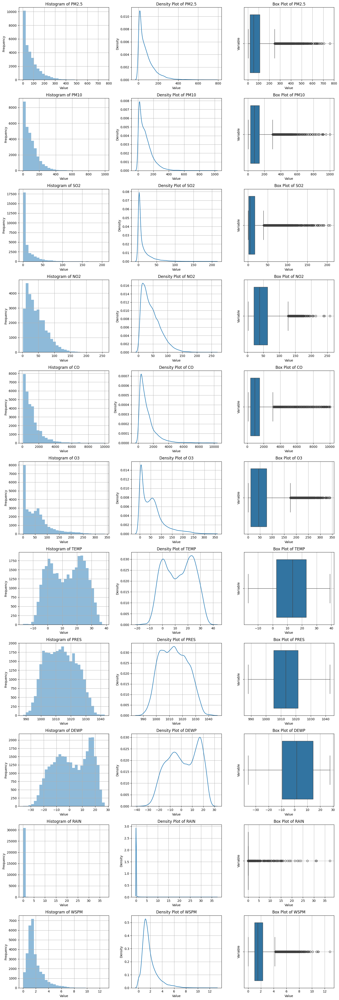

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming df is your pandas DataFrame containing the dataset
# You can load your dataset using pd.read_csv() or any other appropriate method
df = df_0
# Select pollutant concentration and meteorological variables for analysis
variables_of_interest = ['PM2.5', 'PM10', 'SO2', 'NO2', 'CO', 'O3', 'TEMP', 'PRES', 'DEWP', 'RAIN', 'WSPM']

# Plot distribution of each variable into separate subplots
num_plots = len(variables_of_interest)
fig, axes = plt.subplots(num_plots, 3, figsize=(15, 4*num_plots))

for i, variable in enumerate(variables_of_interest):
    # Histogram
    axes[i, 0].hist(df[variable].dropna(), bins=30, alpha=0.5)
    axes[i, 0].set_title(f'Histogram of {variable}')
    axes[i, 0].set_xlabel('Value')
    axes[i, 0].set_ylabel('Frequency')
    axes[i, 0].grid(True)

    # Density plot
    sns.kdeplot(df[variable].dropna(), ax=axes[i, 1])
    axes[i, 1].set_title(f'Density Plot of {variable}')
    axes[i, 1].set_xlabel('Value')
    axes[i, 1].set_ylabel('Density')
    axes[i, 1].grid(True)

    # Box plot
    sns.boxplot(x=df[variable].dropna(), ax=axes[i, 2], orient='h')
    axes[i, 2].set_title(f'Box Plot of {variable}')
    axes[i, 2].set_xlabel('Value')
    axes[i, 2].set_ylabel('Variable')
    axes[i, 2].grid(True)

plt.tight_layout()
plt.show()


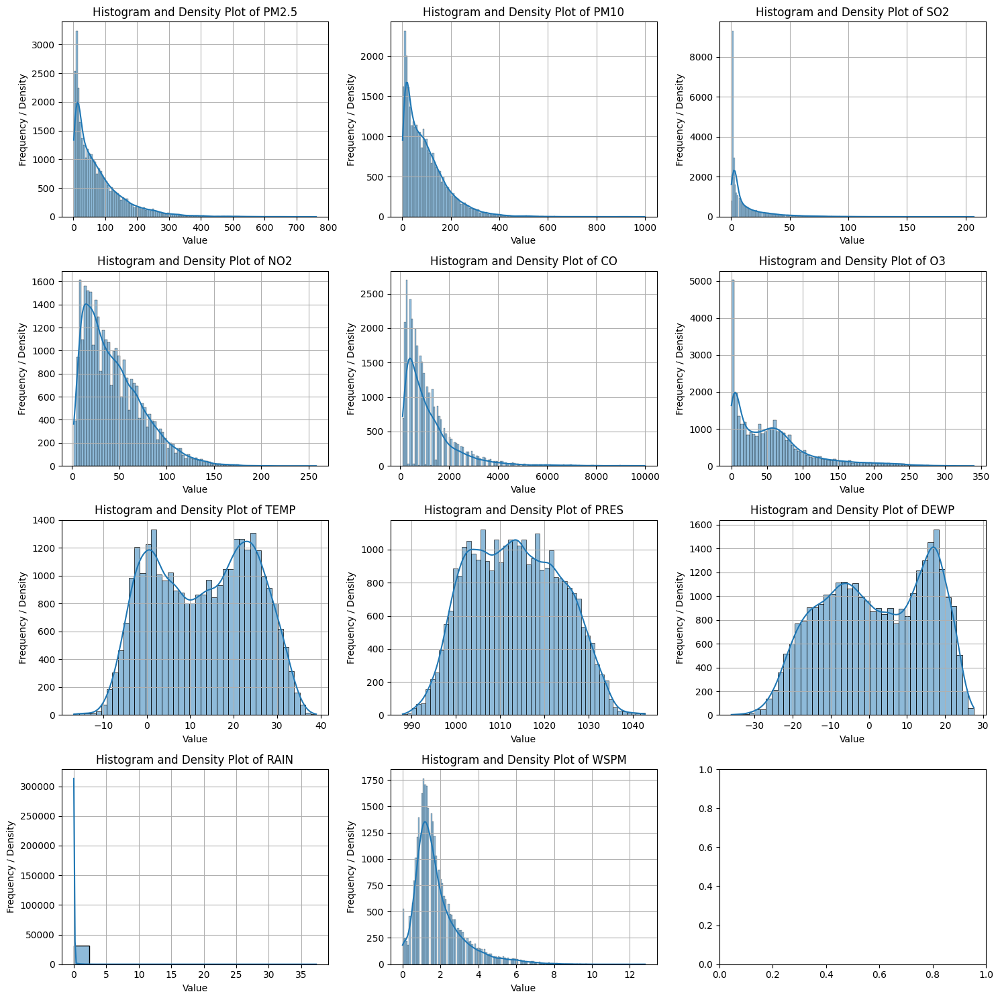

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming df is your pandas DataFrame containing the dataset
# You can load your dataset using pd.read_csv() or any other appropriate method
df = df_0
# Select pollutant concentration and meteorological variables for analysis
variables_of_interest = ['PM2.5', 'PM10', 'SO2', 'NO2', 'CO', 'O3', 'TEMP', 'PRES', 'DEWP', 'RAIN', 'WSPM']

# Plot histogram and density plot for each variable
fig, axes = plt.subplots(4, 3, figsize=(15, 15))

for i, variable in enumerate(variables_of_interest):
    row = i // 3
    col = i % 3
    sns.histplot(df[variable].dropna(), ax=axes[row, col], kde=True)
    axes[row, col].set_title(f'Histogram and Density Plot of {variable}')
    axes[row, col].set_xlabel('Value')
    axes[row, col].set_ylabel('Frequency / Density')
    axes[row, col].grid(True)

plt.tight_layout()
plt.show()


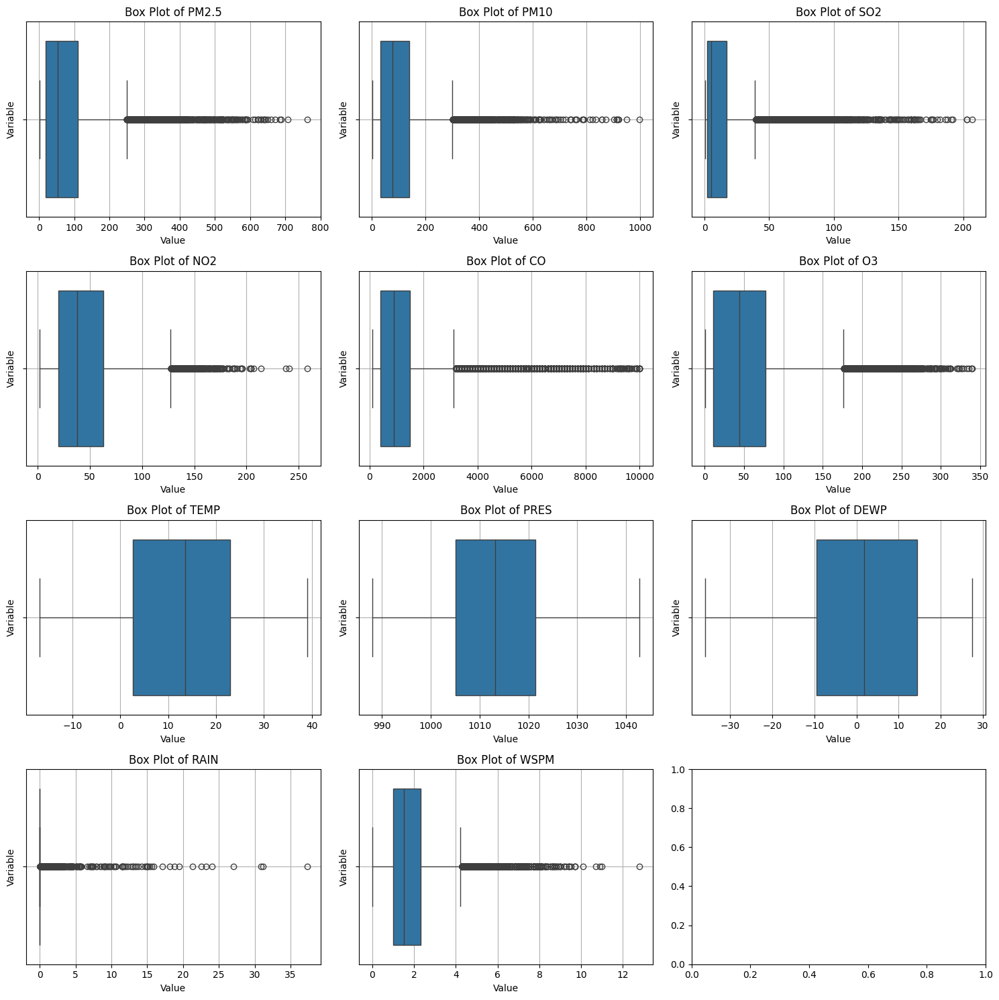

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming df is your pandas DataFrame containing the dataset
# You can load your dataset using pd.read_csv() or any other appropriate method
df = df_0
# Select pollutant concentration and meteorological variables for analysis
variables_of_interest = ['PM2.5', 'PM10', 'SO2', 'NO2', 'CO', 'O3', 'TEMP', 'PRES', 'DEWP', 'RAIN', 'WSPM']

# Plot box plot of each variable into separate subplots
num_plots = len(variables_of_interest)
fig, axes = plt.subplots(4, 3, figsize=(15, 15))

for i, variable in enumerate(variables_of_interest):
    row = i // 3
    col = i % 3
    sns.boxplot(x=df[variable].dropna(), ax=axes[row, col], orient='h')
    axes[row, col].set_title(f'Box Plot of {variable}')
    axes[row, col].set_xlabel('Value')
    axes[row, col].set_ylabel('Variable')
    axes[row, col].grid(True)

plt.tight_layout()
plt.show()


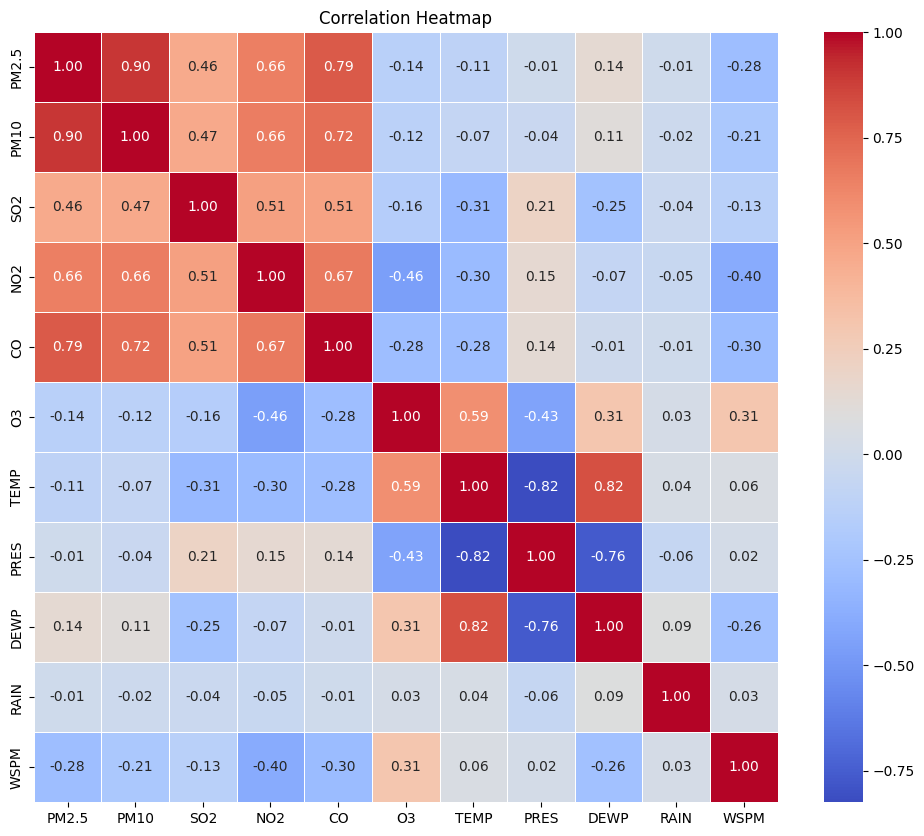

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
df = df_0
# Assuming df is your pandas DataFrame containing the dataset
# You can load your dataset using pd.read_csv() or any other appropriate method

# Select only numeric columns for correlation analysis
numeric_df = df.select_dtypes(include=['number'])

# Calculate correlation matrix
correlation_matrix = numeric_df.corr()

# Plot correlation heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title('Correlation Heatmap')
plt.show()


<Figure size 1500x1500 with 0 Axes>

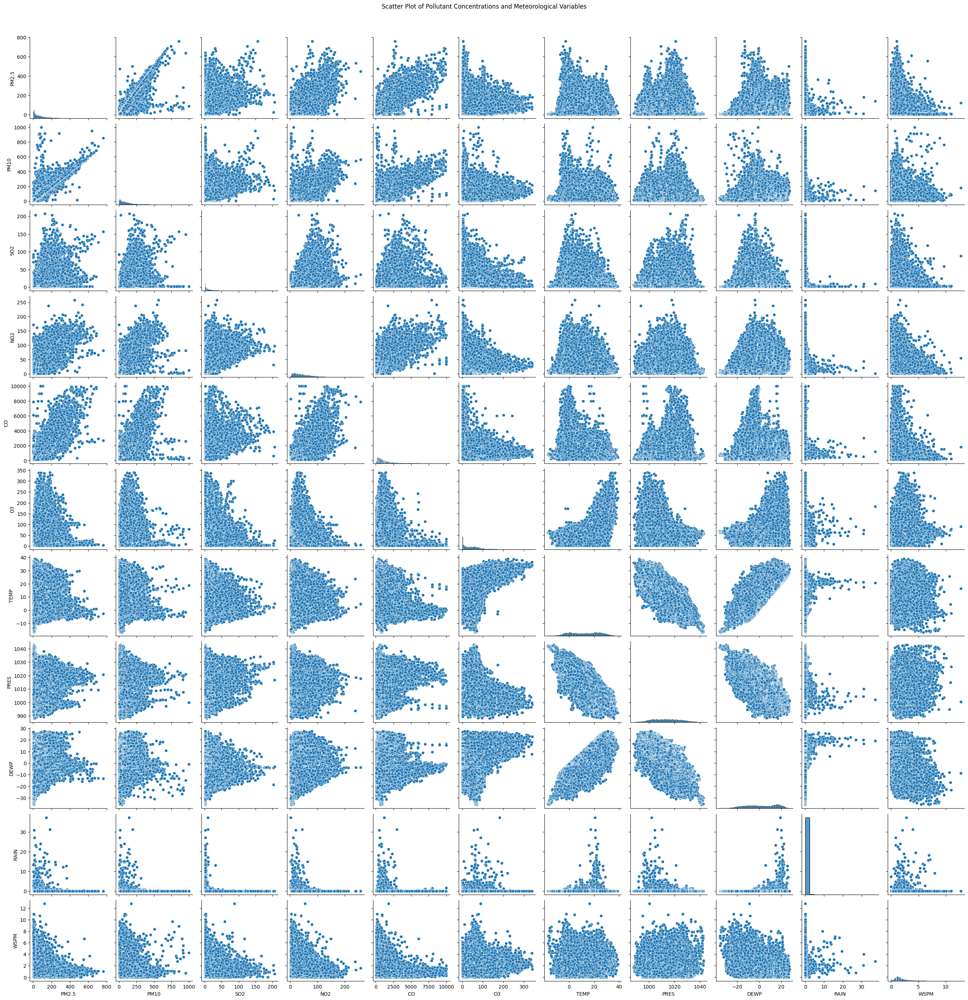

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming df is your pandas DataFrame containing the dataset
# You can load your dataset using pd.read_csv() or any other appropriate method
df = df_0
# Select pollutant concentration and meteorological variables for analysis
variables_of_interest = ['PM2.5', 'PM10', 'SO2', 'NO2', 'CO', 'O3', 'TEMP', 'PRES', 'DEWP', 'RAIN', 'WSPM']

# Plot box plots for each variable to identify outliers
# plt.figure(figsize=(15, 10))
# for i, variable in enumerate(variables_of_interest, start=1):
#     plt.subplot(4, 3, i)
#     sns.boxplot(data=df[variable], orient='h')
#     plt.title(f'Box Plot of {variable}')
#     plt.xlabel('Value')
#     plt.grid(True)

# plt.tight_layout()
# plt.show()

# Plot scatter plots for each pair of variables to identify outliers
plt.figure(figsize=(15, 15))
sns.pairplot(df[variables_of_interest].dropna(), kind='scatter')
plt.suptitle('Scatter Plot of Pollutant Concentrations and Meteorological Variables', y=1.02)
plt.show()


In [ ]:
# import pandas as pd
# import folium

# # Assuming df is your pandas DataFrame containing the dataset
# # You can load your dataset using pd.read_csv() or any other appropriate method
# # Make sure your DataFrame contains location information for monitoring sites

# # Sample DataFrame with location information
# # Replace latitude and longitude columns with the actual columns from your dataset
# # You may also need to adjust the zoom_start parameter based on your data
# df_locations = pd.DataFrame({
#     'site': ['Site 1', 'Site 2', 'Site 3', 'Site 4'],  # Example site names
#     'latitude': [39.9042, 31.2304, 30.5928, 23.1291],  # Example latitude values for major cities in China
#     'longitude': [116.4074, 121.4737, 114.3055, 113.2644]  # Example longitude values for major cities in China
# })

# # Create a folium map object centered around the mean latitude and longitude of all sites
# map_center = [df_locations['latitude'].mean(), df_locations['longitude'].mean()]
# m = folium.Map(location=map_center, zoom_start=5)

# # Add markers for each monitoring site with popup information
# for index, row in df_locations.iterrows():
#     popup_info = f"Site: {row['site']}"
#     folium.Marker(location=[row['latitude'], row['longitude']], popup=popup_info).add_to(m)

# # Display the map
# m.save("map.html")  # Save map as HTML file
# m


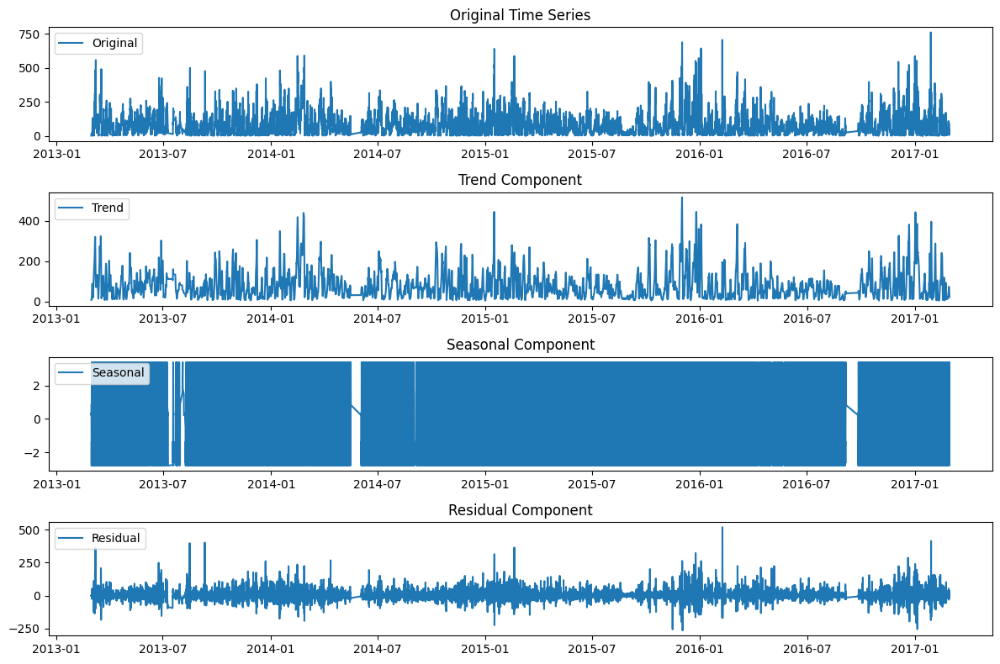

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from statsmodels.tsa.seasonal import seasonal_decompose

# Assuming df is your pandas DataFrame containing the time series data
# You can load your dataset using pd.read_csv() or any other appropriate method
# Make sure your DataFrame has a 'timestamp' column representing the time

# Convert the 'timestamp' column to datetime format if it's not already in datetime
# df['timestamp'] = pd.to_datetime(df['timestamp'])

# Set the 'timestamp' column as the index of the DataFrame
# df.set_index('timestamp', inplace=True)

# Select one variable for seasonal decomposition (e.g., PM2.5 concentration)
variable_of_interest = 'PM2.5'

# Perform seasonal decomposition
decomposition = seasonal_decompose(df[variable_of_interest], model='additive', period=24)  # Assuming daily seasonality (24 hours)

# Plot the original time series, trend, seasonal, and residual components
plt.figure(figsize=(12, 8))
plt.subplot(411)
plt.plot(df.index, df[variable_of_interest], label='Original')
plt.legend(loc='upper left')
plt.title('Original Time Series')
plt.subplot(412)
plt.plot(df.index, decomposition.trend, label='Trend')
plt.legend(loc='upper left')
plt.title('Trend Component')
plt.subplot(413)
plt.plot(df.index, decomposition.seasonal, label='Seasonal')
plt.legend(loc='upper left')
plt.title('Seasonal Component')
plt.subplot(414)
plt.plot(df.index, decomposition.resid, label='Residual')
plt.legend(loc='upper left')
plt.title('Residual Component')
plt.tight_layout()
plt.show()


In [ ]:
df.columns

Index(['PM2.5', 'PM10', 'SO2', 'NO2', 'CO', 'O3', 'TEMP', 'PRES', 'DEWP',
       'RAIN', 'wd', 'WSPM'],
      dtype='object')

In [ ]:
# df = df_0

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from statsmodels.tsa.seasonal import seasonal_decompose

# Assuming df is your pandas DataFrame containing the time series data
# You can load your dataset using pd.read_csv() or any other appropriate method
# Make sure your DataFrame has a 'timestamp' column representing the time

# Convert the 'timestamp' column to datetime format if it's not already in datetime
# df['timestamp'] = pd.to_datetime(df['timestamp'])

# Set the 'timestamp' column as the index of the DataFrame
# df.set_index('timestamp', inplace=True)
df = df_0
# Select the variable of interest for seasonal decomposition (e.g., PM2.5 concentration)
variable_of_interest = ['PM2.5', 'PM10', 'SO2', 'NO2', 'CO', 'O3', 'TEMP', 'PRES', 'DEWP', 'RAIN', 'WSPM']

# Convert data into weekly frequency and take the mean
# Convert the resampled series to a DataFrame
df_weekly = pd.DataFrame(df[variable_of_interest].resample('W').mean())

print(df_weekly.columns)

# Replace missing values with 0
df_weekly.fillna(0, inplace=True)

# Print the DataFrame with missing values replaced
print(df_weekly)


Index(['PM2.5', 'PM10', 'SO2', 'NO2', 'CO', 'O3', 'TEMP', 'PRES', 'DEWP',
       'RAIN', 'WSPM'],
      dtype='object')
                 PM2.5        PM10        SO2        NO2           CO  \
timestamp                                                               
2013-03-03   40.617647   49.235294  18.779412  43.602941  1045.558824   
2013-03-10  149.170213  174.141844  59.391183  83.802336  2125.719858   
2013-03-17  153.791667  156.869048  45.375000  71.970238  1594.779762   
2013-03-24   57.133333   67.078788  11.539394  40.006061   850.242424   
2013-03-31  100.865854  121.817073  24.890244  53.775243  1312.920552   
...                ...         ...        ...        ...          ...   
2017-02-05   88.225806   91.806452  24.987097  42.322581  1500.645161   
2017-02-12   37.552147   47.466258  14.625767  32.490798   919.325153   
2017-02-19  113.878788  127.406061  27.490909  65.036364  1628.484848   
2017-02-26   34.261745   43.114094   9.711409  42.731544   810.067114   
2017

In [ ]:
# Perform seasonal decomposition on the weekly data
decomposition_weekly = seasonal_decompose(df_weekly[variable_of_interest], model='additive', period=7)  # Assuming weekly seasonality (7 days)

# Plot the trend, seasonal, and residual components along with the original time series
plt.figure(figsize=(12, 8))

# Original time series
plt.subplot(411)
plt.plot(df_weekly.index, df_weekly[variable_of_interest], label='Original', color='black')
plt.title('Original Time Series')

# Trend component
plt.subplot(412)
plt.plot(decomposition_weekly.trend.index, decomposition_weekly.trend.values, label='Trend', color='blue')
plt.title('Trend Component')

# Seasonal component
plt.subplot(413)
plt.plot(decomposition_weekly.seasonal.index, decomposition_weekly.seasonal.values, label='Seasonal', color='green')
plt.title('Seasonal Component')

# Residual component
plt.subplot(414)
plt.plot(decomposition_weekly.resid.index, decomposition_weekly.resid.values, label='Residual', color='red')
plt.title('Residual Component')

plt.tight_layout()
plt.show()


TypeError: Index(...) must be called with a collection of some kind, 'seasonal' was passed

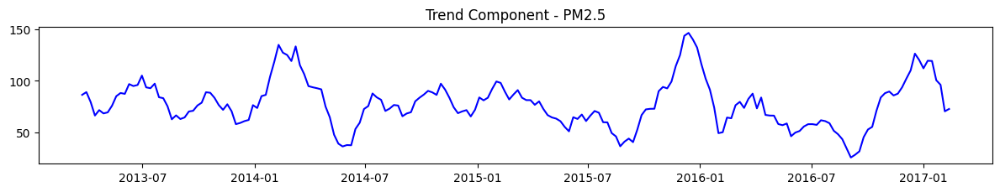

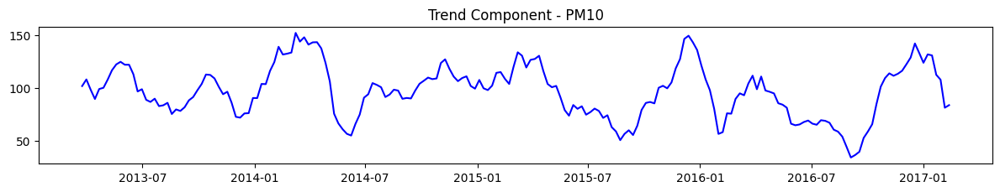

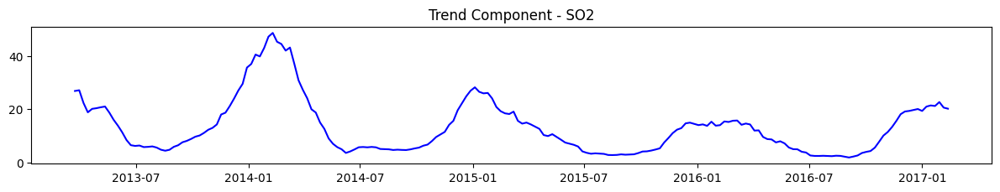

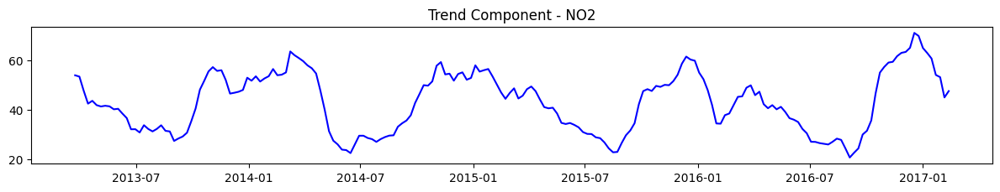

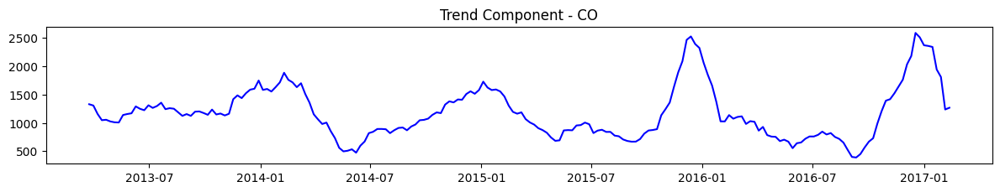

...

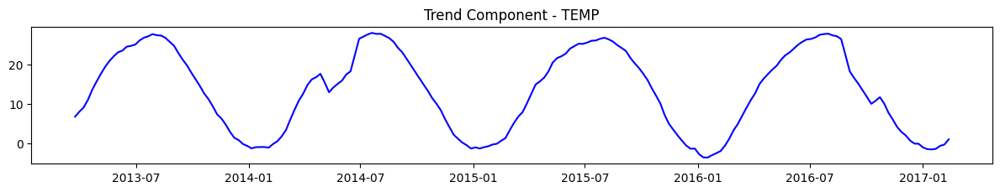

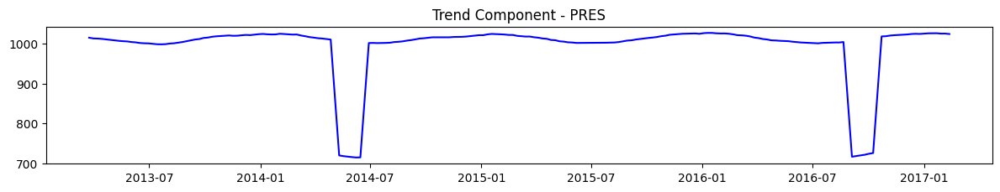

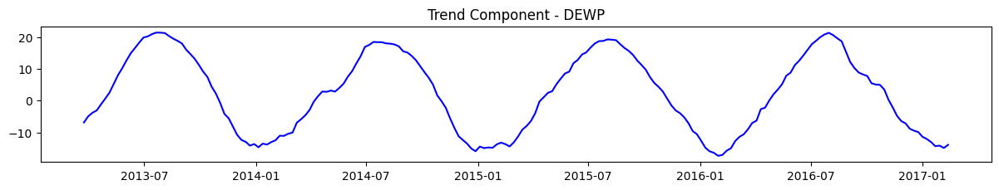

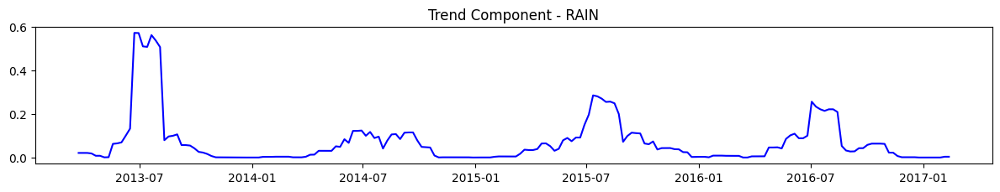

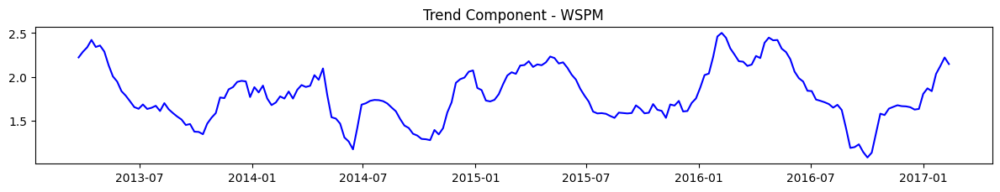

In [ ]:

# Loop through each variable and perform seasonal decomposition
for variable in variable_of_interest:
    # Perform seasonal decomposition on the weekly data
    decomposition_weekly = seasonal_decompose(df_weekly[variable], model='additive', period=7)  # Assuming weekly seasonality (7 days)

    # Plot the trend, seasonal, and residual components along with the original time series
    plt.figure(figsize=(12, 8))

    # # Original time series
    # plt.subplot(411)
    # plt.plot(df_weekly.index, df_weekly[variable], label='Original', color='black')
    # plt.title(f'Original Time Series - {variable}')

    # Trend component
    plt.subplot(412)
    plt.plot(decomposition_weekly.trend.index, decomposition_weekly.trend.values, label='Trend', color='blue')
    plt.title(f'Trend Component - {variable}')

    # # Seasonal component
    # plt.subplot(413)
    # plt.plot(decomposition_weekly.seasonal.index, decomposition_weekly.seasonal.values, label='Seasonal', color='green')
    # plt.title(f'Seasonal Component - {variable}')

    # # Residual component
    # plt.subplot(414)
    # plt.plot(decomposition_weekly.resid.index, decomposition_weekly.resid.values, label='Residual', color='red')
    # plt.title(f'Residual Component - {variable}')

    plt.tight_layout()
    plt.show()


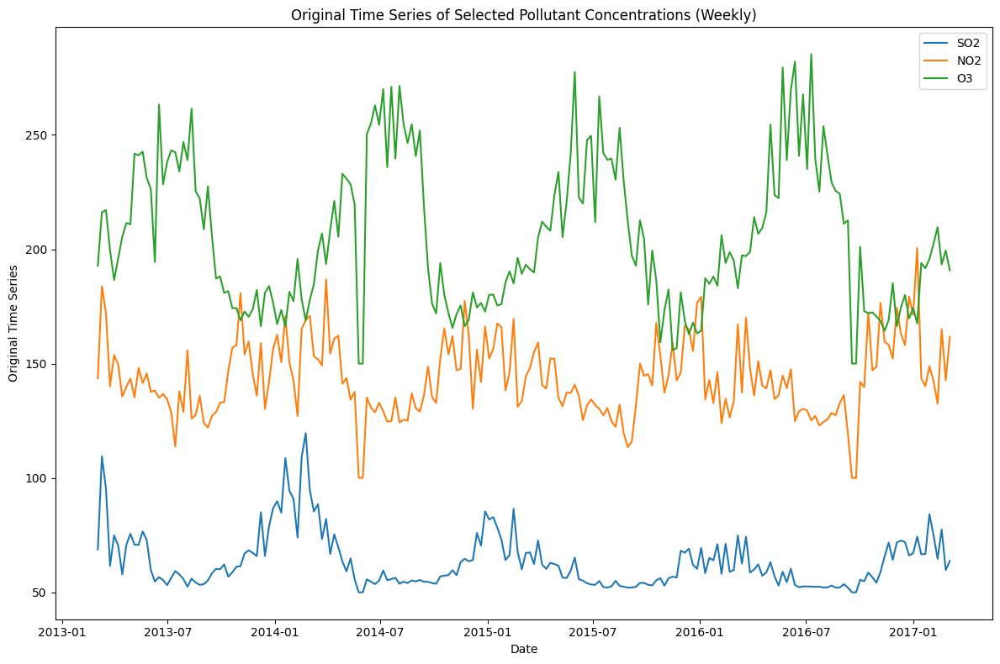

In [ ]:
# Select variables of interest
variables_to_plot = ['SO2', 'NO2', 'O3']

# Initialize the figure
plt.figure(figsize=(12, 8))

# Loop through each variable and plot the original time series
for i, variable in enumerate(variables_to_plot, start=1):
    # Plot the original time series for the current variable
    plt.plot(df_weekly.index, df_weekly[variable] + i * 50, label=variable)

# Set labels and title
plt.xlabel('Date')
plt.ylabel('Original Time Series')
plt.title('Original Time Series of Selected Pollutant Concentrations (Weekly)')

# Add legend
plt.legend()

# Show plot
plt.tight_layout()
plt.show()


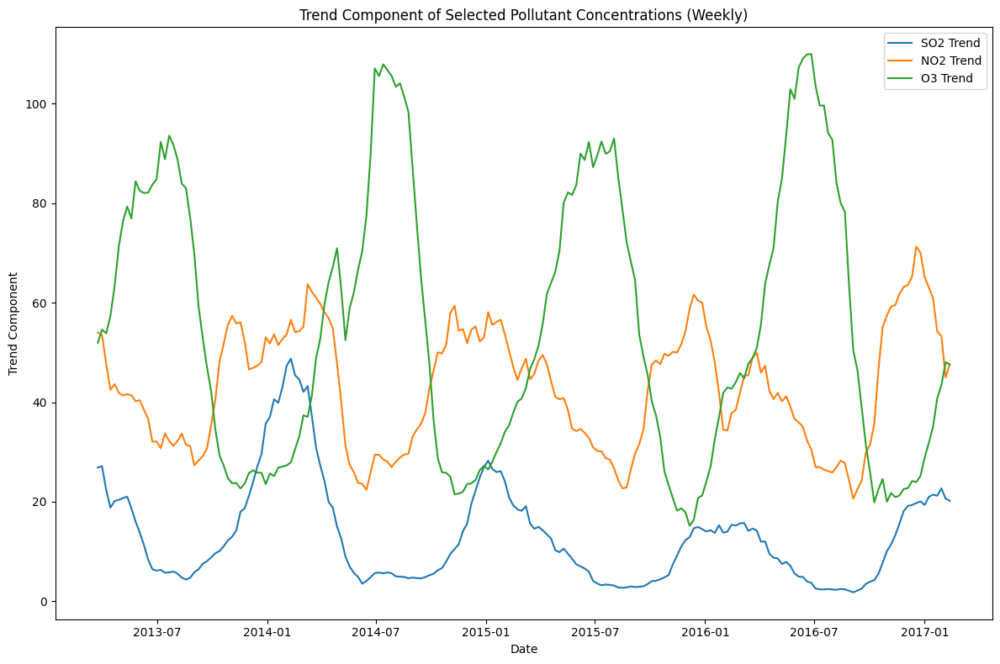

In [ ]:
# Select variables of interest
variables_to_plot = ['SO2', 'NO2', 'O3']

# Initialize the figure
plt.figure(figsize=(12, 8))

# Loop through each variable and perform seasonal decomposition
for variable in variables_to_plot:
    # Perform seasonal decomposition on the weekly data
    decomposition_weekly = seasonal_decompose(df_weekly[variable], model='additive', period=7)  # Assuming weekly seasonality (7 days)

    # Plot the trend component for the current variable
    plt.plot(decomposition_weekly.trend.index, decomposition_weekly.trend.values, label=f'{variable} Trend')

# Set labels and title
plt.xlabel('Date')
plt.ylabel('Trend Component')
plt.title('Trend Component of Selected Pollutant Concentrations (Weekly)')

# Add legend
plt.legend()

# Show plot
plt.tight_layout()
plt.show()


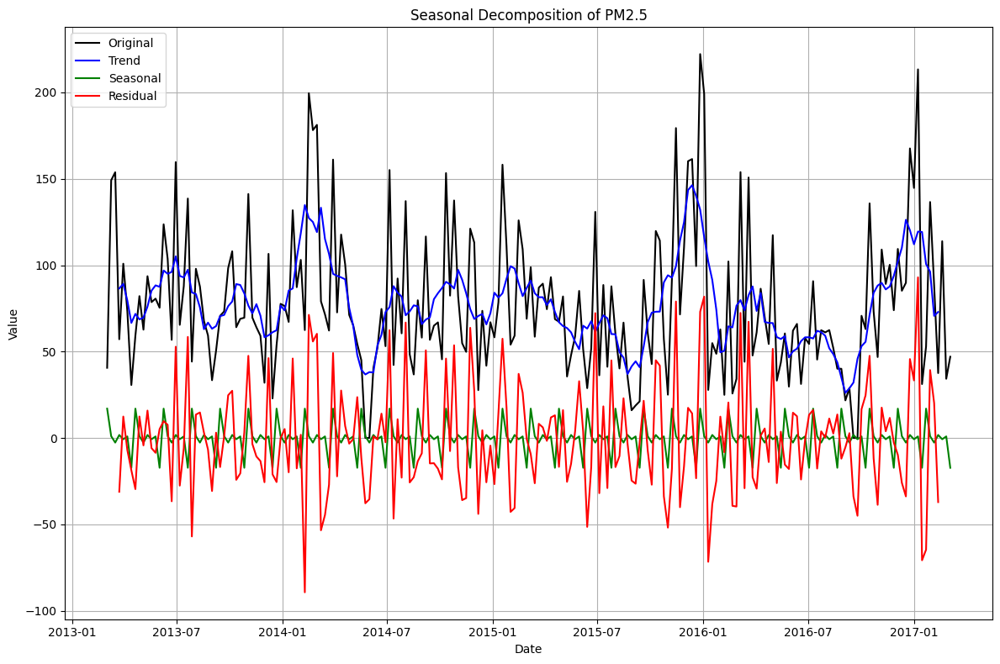

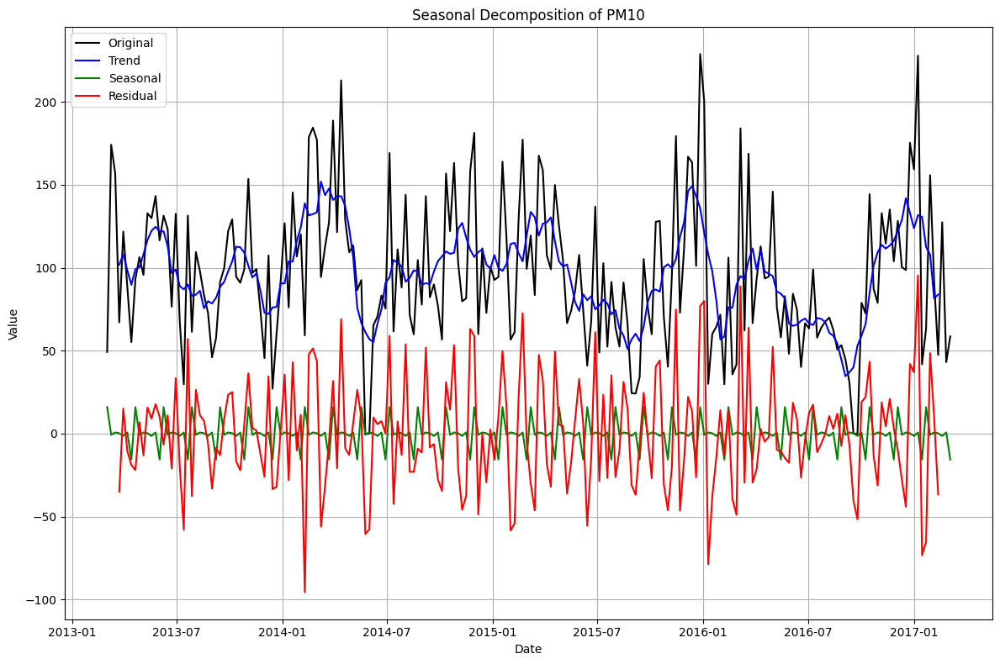

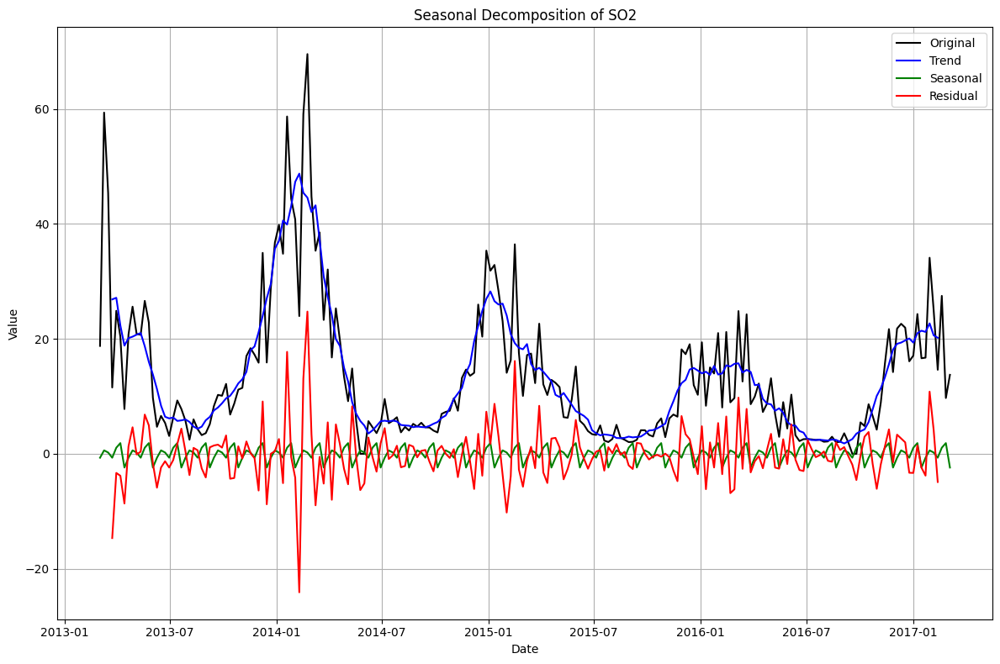

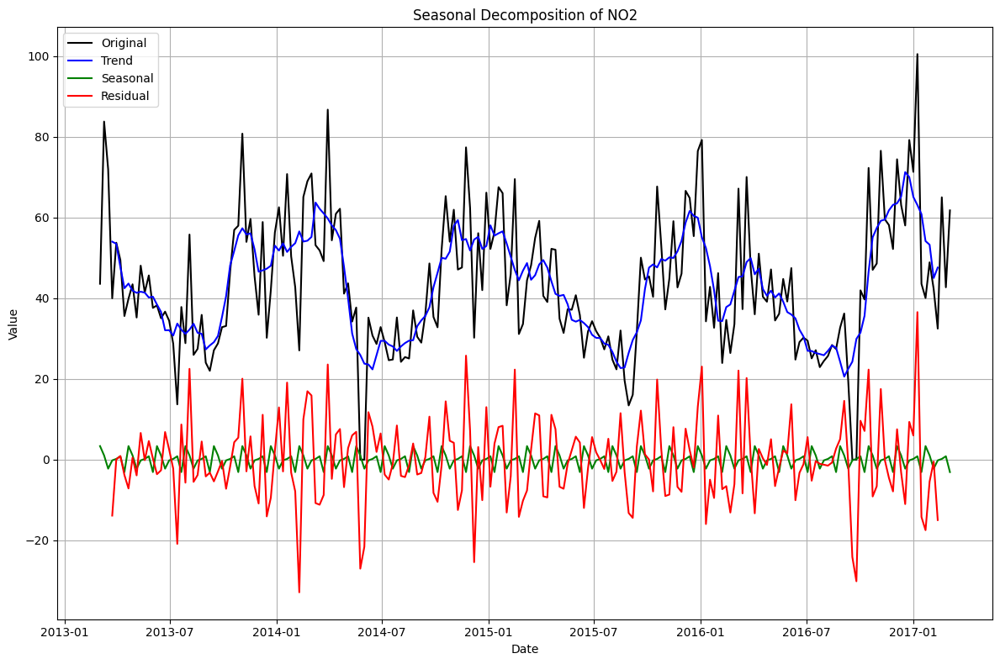

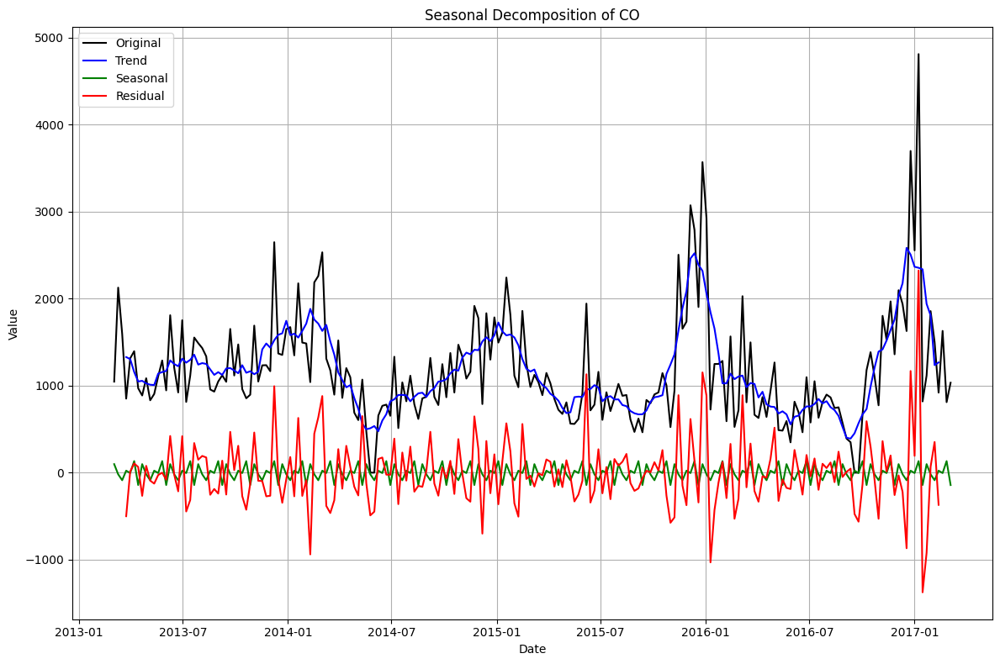

...

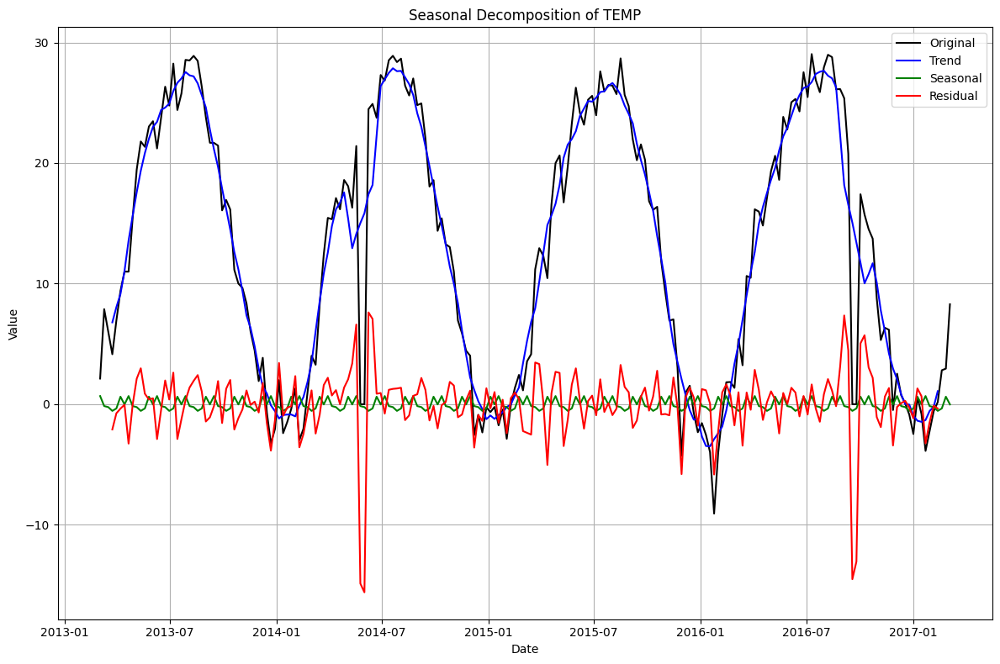

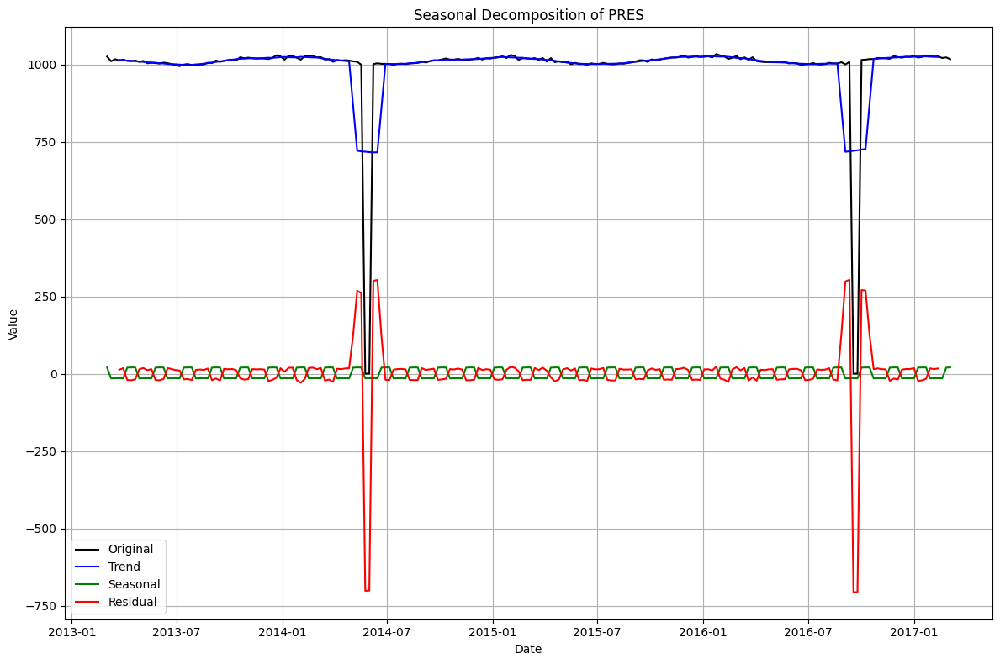

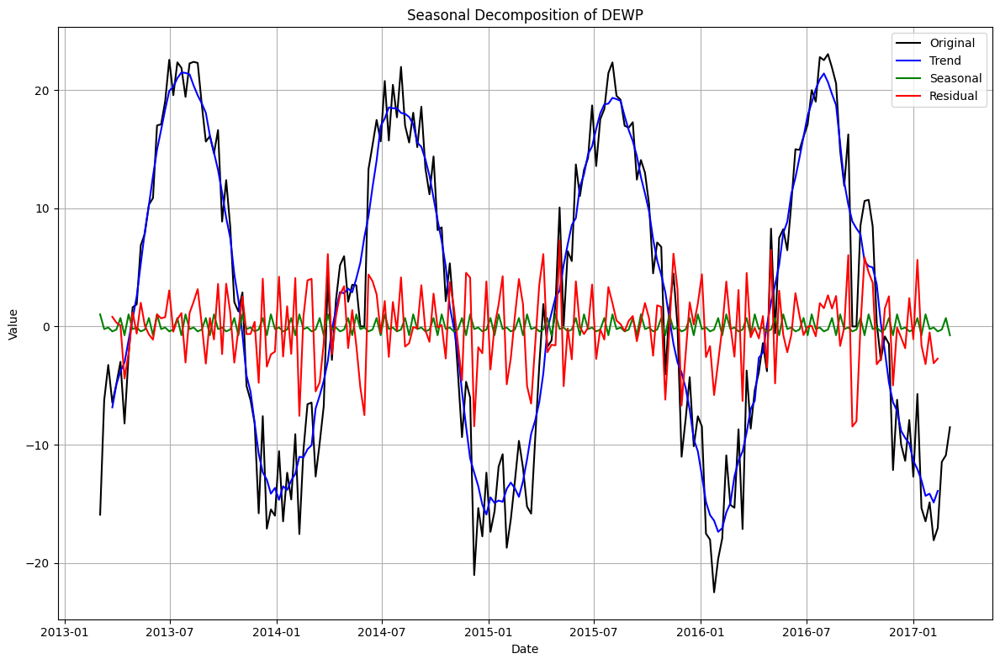

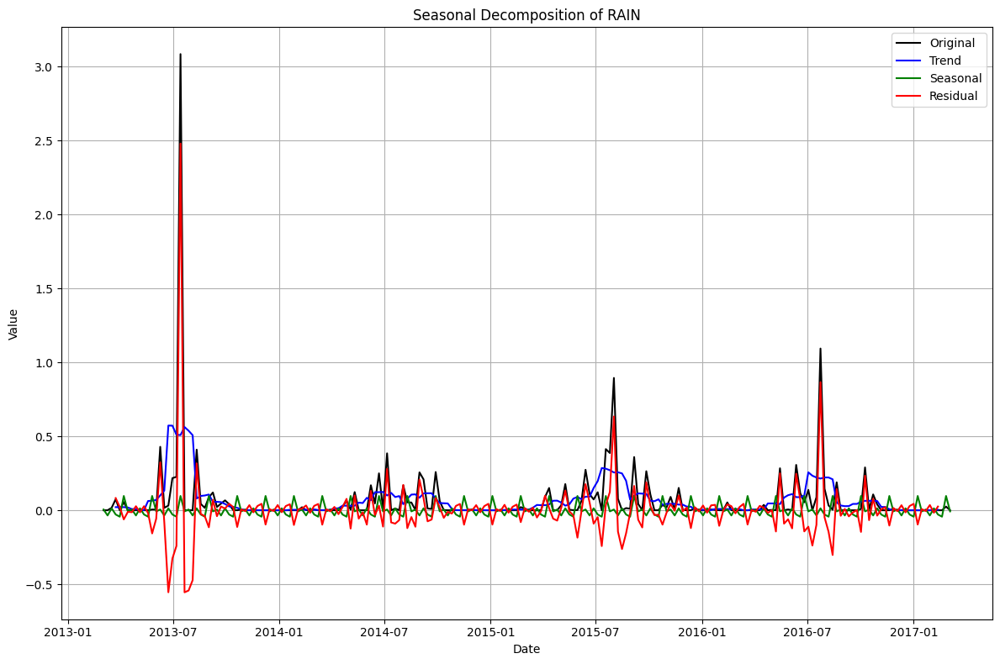

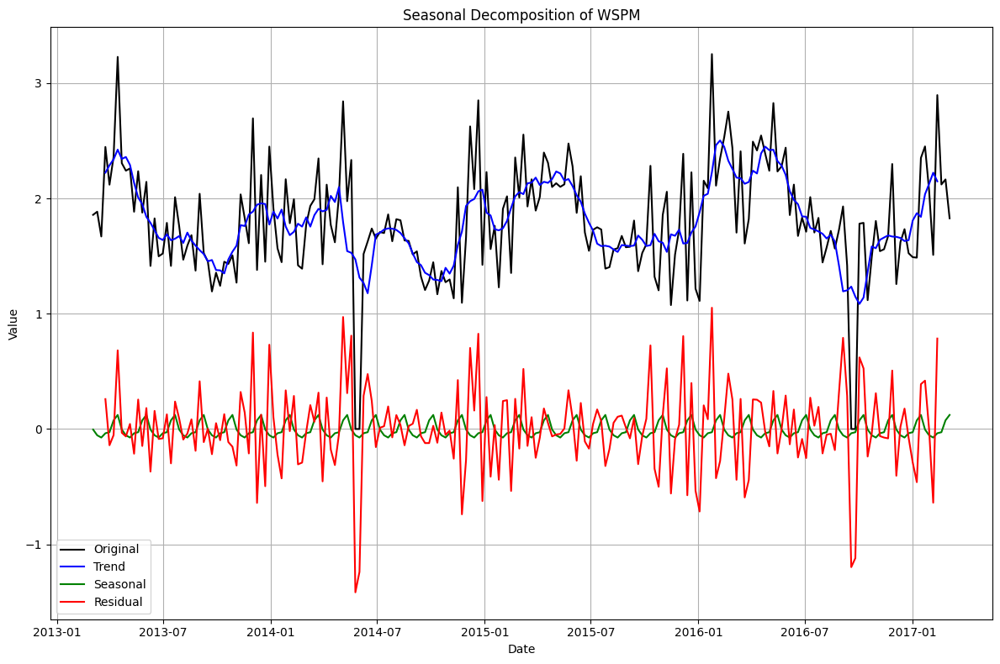

In [ ]:
# Loop through each variable and perform seasonal decomposition
for variable in variable_of_interest:
    # Perform seasonal decomposition on the weekly data
    decomposition_weekly = seasonal_decompose(df_weekly[variable], model='additive', period=7)  # Assuming weekly seasonality (7 days)

    # Plot the trend, seasonal, and residual components along with the original time series
    plt.figure(figsize=(12, 8))

    # Original time series
    plt.plot(df_weekly.index, df_weekly[variable], label='Original', color='black')

    # Trend component
    plt.plot(decomposition_weekly.trend.index, decomposition_weekly.trend.values, label='Trend', color='blue')

    # Seasonal component
    plt.plot(decomposition_weekly.seasonal.index, decomposition_weekly.seasonal.values, label='Seasonal', color='green')

    # Residual component
    plt.plot(decomposition_weekly.resid.index, decomposition_weekly.resid.values, label='Residual', color='red')

    plt.title(f'Seasonal Decomposition of {variable}')
    plt.xlabel('Date')
    plt.ylabel('Value')
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()


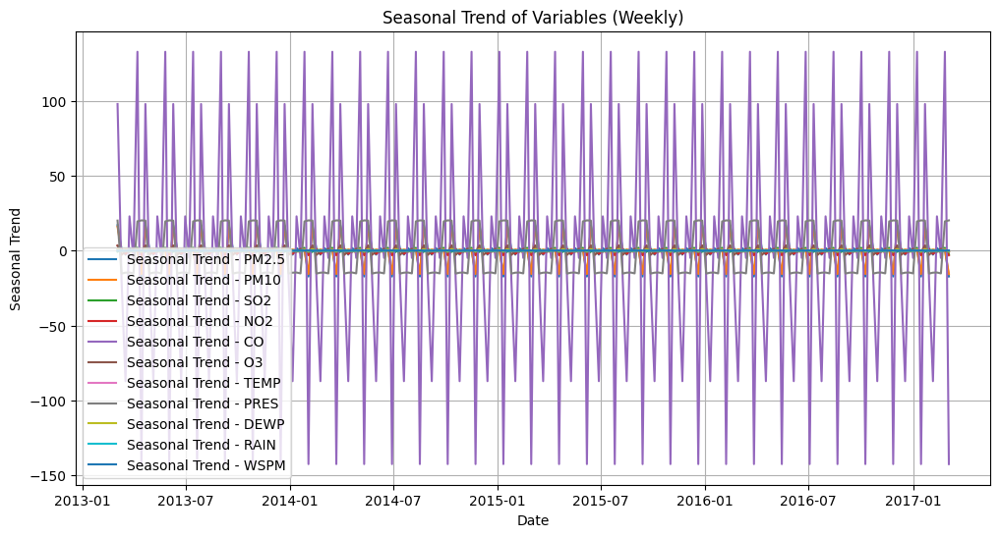

In [ ]:
# Initialize the figure
plt.figure(figsize=(12, 6))

# Loop through each variable and plot the seasonal component
for variable in variable_of_interest:
    # Perform seasonal decomposition on the weekly data
    decomposition_weekly = seasonal_decompose(df_weekly[variable], model='additive', period=7)  # Assuming weekly seasonality (7 days)

    # Plot the seasonal component for the current variable
    plt.plot(decomposition_weekly.seasonal.index, decomposition_weekly.seasonal.values, label=f'Seasonal Trend - {variable}')

# Set labels and title
plt.title('Seasonal Trend of Variables (Weekly)')
plt.xlabel('Date')
plt.ylabel('Seasonal Trend')
plt.legend()
plt.grid(True)
plt.show()


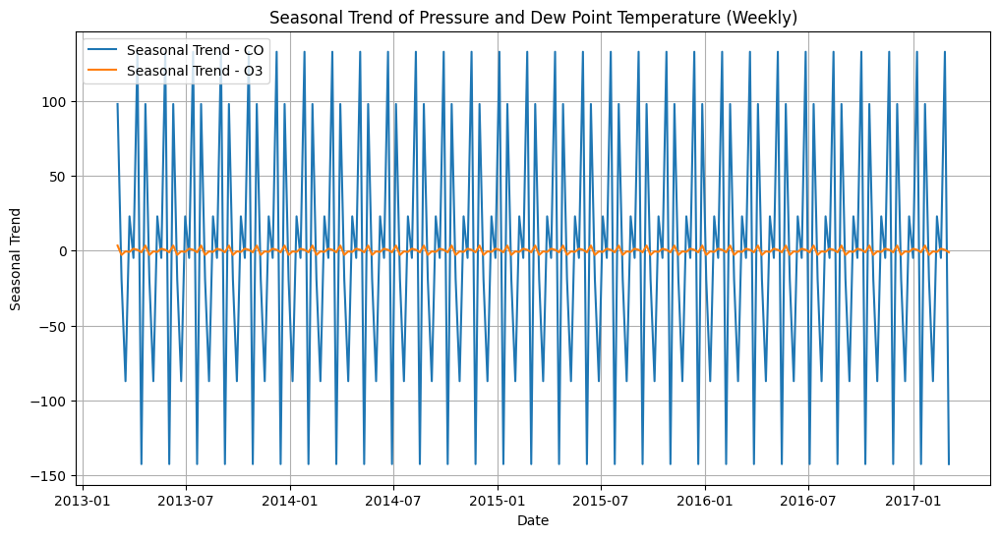

In [ ]:
# Select variables of interest
variables_to_plot = ['CO', 'O3']

# Initialize the figure
plt.figure(figsize=(12, 6))

# Loop through each variable and plot the seasonal component
for variable in variables_to_plot:
    # Perform seasonal decomposition on the weekly data
    decomposition_weekly = seasonal_decompose(df_weekly[variable], model='additive', period=7)  # Assuming weekly seasonality (7 days)

    # Plot the seasonal component for the current variable
    plt.plot(decomposition_weekly.seasonal.index, decomposition_weekly.seasonal.values, label=f'Seasonal Trend - {variable}')

# Set labels and title
plt.title('Seasonal Trend of Pressure and Dew Point Temperature (Weekly)')
plt.xlabel('Date')
plt.ylabel('Seasonal Trend')
plt.legend()
plt.grid(True)
plt.show()


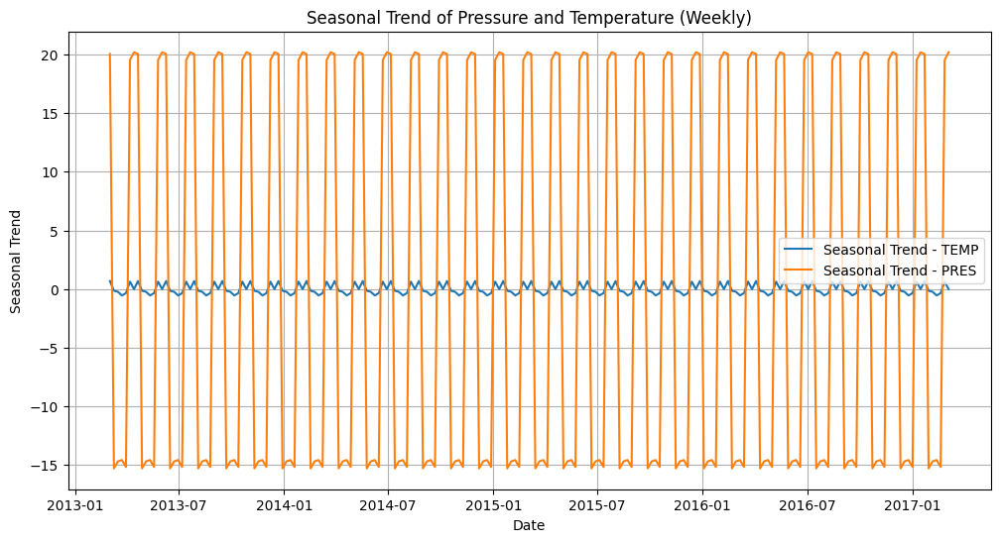

In [ ]:
# Select variables of interest
variables_to_plot = ['TEMP', 'PRES']

# Initialize the figure
plt.figure(figsize=(12, 6))

# Loop through each variable and plot the seasonal component
for variable in variables_to_plot:
    # Perform seasonal decomposition on the weekly data
    decomposition_weekly = seasonal_decompose(df_weekly[variable], model='additive', period=7)  # Assuming weekly seasonality (7 days)

    # Plot the seasonal component for the current variable
    plt.plot(decomposition_weekly.seasonal.index, decomposition_weekly.seasonal.values, label=f'Seasonal Trend - {variable}')

# Set labels and title
plt.title('Seasonal Trend of Pressure and Temperature (Weekly)')
plt.xlabel('Date')
plt.ylabel('Seasonal Trend')
plt.legend()
plt.grid(True)
plt.show()


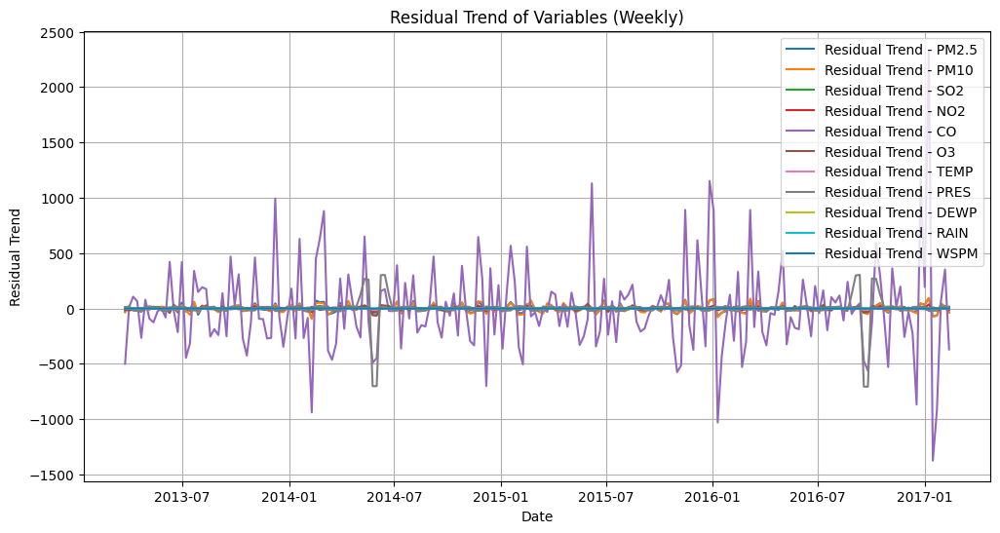

In [ ]:
# Initialize the figure
plt.figure(figsize=(12, 6))

# Loop through each variable and plot the residual component trend
for variable in variable_of_interest:
    # Perform seasonal decomposition on the weekly data
    decomposition_weekly = seasonal_decompose(df_weekly[variable], model='additive', period=7)  # Assuming weekly seasonality (7 days)

    # Plot the residual component trend for the current variable
    plt.plot(decomposition_weekly.resid.index, decomposition_weekly.resid.values, label=f'Residual Trend - {variable}')

# Set labels and title
plt.title('Residual Trend of Variables (Weekly)')
plt.xlabel('Date')
plt.ylabel('Residual Trend')
plt.legend()
plt.grid(True)
plt.show()


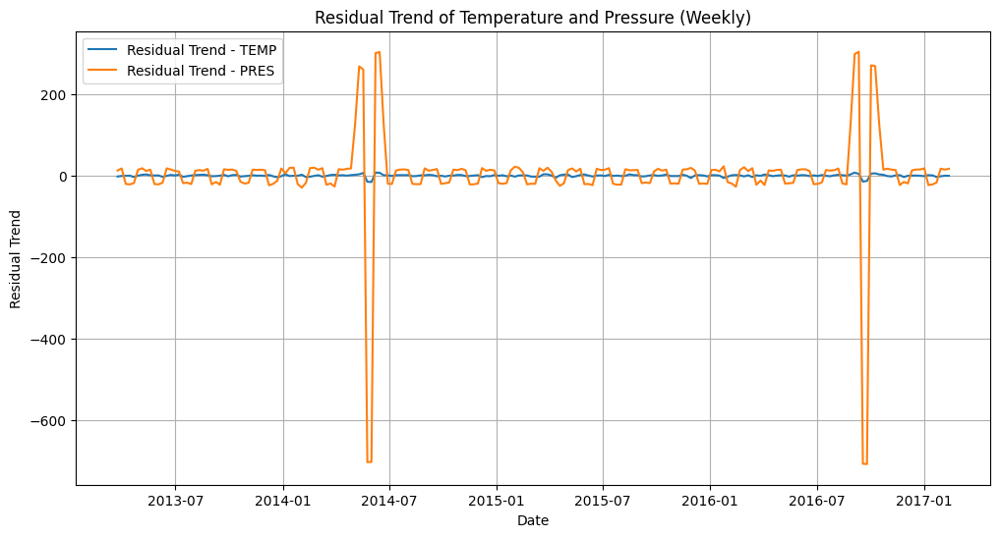

In [ ]:
# Initialize the figure
plt.figure(figsize=(12, 6))

# Loop through PM2.5 and PM10
for variable in ['TEMP', 'PRES']:
    # Perform seasonal decomposition on the weekly data
    decomposition_weekly = seasonal_decompose(df_weekly[variable], model='additive', period=7)  # Assuming weekly seasonality (7 days)

    # Plot the residual component trend for the current variable
    plt.plot(decomposition_weekly.resid.index, decomposition_weekly.resid.values, label=f'Residual Trend - {variable}')

# Set labels and title
plt.title('Residual Trend of Temperature and Pressure (Weekly)')
plt.xlabel('Date')
plt.ylabel('Residual Trend')
plt.legend()
plt.grid(True)
plt.show()


In [ ]:
import pandas as pd

# Assuming df is your pandas DataFrame containing the dataset
# You can load your dataset using pd.read_csv() or any other appropriate method
# Make sure your DataFrame has a 'timestamp' column representing the time
df = df_0
# Sample DataFrame with air quality and meteorological data
# Replace this with your actual DataFrame
# Example columns: timestamp, PM2.5, PM10, SO2, NO2, CO, O3, TEMP, PRES, DEWP, RAIN, wd, WSPM
# Example: df = pd.read_csv("your_dataset.csv")
df = pd.DataFrame({
    'timestamp': pd.date_range(start='2024-01-01', periods=1000, freq='H'),  # Example timestamp range
    'PM2.5': [10] * 500 + [50] * 500,  # Example PM2.5 values
    'PM10': [15] * 500 + [60] * 500,  # Example PM10 values
    'TEMP': [15] * 500 + [25] * 500,  # Example temperature values
    'RAIN': [0] * 500 + [20] * 500  # Example rainfall values
})

# Define the time period of interest for the event analysis
start_date = '2024-01-15'
end_date = '2024-01-17'

# Filter the DataFrame to include data only within the specified time period
event_data = df[(df['timestamp'] >= start_date) & (df['timestamp'] <= end_date)]

# Analyze the impact of the event on air quality and meteorological conditions
mean_PM25 = event_data['PM2.5'].mean()
mean_PM10 = event_data['PM10'].mean()
mean_TEMP = event_data['TEMP'].mean()
total_rainfall = event_data['RAIN'].sum()

# Print the analysis results
print(f"Event Analysis Results:")
print(f"Mean PM2.5 during the event: {mean_PM25}")
print(f"Mean PM10 during the event: {mean_PM10}")
print(f"Mean Temperature during the event: {mean_TEMP}")
print(f"Total Rainfall during the event: {total_rainfall}")


Event Analysis Results:
Mean PM2.5 during the event: 10.0
Mean PM10 during the event: 15.0
Mean Temperature during the event: 15.0
Total Rainfall during the event: 0


In [ ]:
import pandas as pd

# Assuming df is your pandas DataFrame containing the dataset
# You can load your dataset using pd.read_csv() or any other appropriate method
# Make sure your DataFrame contains relevant variables for feature engineering
df = df_0
# Sample DataFrame with air quality and meteorological data
# Replace this with your actual DataFrame
# Example columns: timestamp, PM2.5, PM10, SO2, NO2, CO, O3, TEMP, PRES, DEWP, RAIN, wd, WSPM
# Example: df = pd.read_csv("your_dataset.csv")
df = pd.DataFrame({
    'timestamp': pd.date_range(start='2024-01-01', periods=1000, freq='H'),  # Example timestamp range
    'PM2.5': [10] * 500 + [50] * 500,  # Example PM2.5 values
    'PM10': [15] * 500 + [60] * 500,  # Example PM10 values
    'TEMP': [15] * 500 + [25] * 500,  # Example temperature values
    'RAIN': [0] * 500 + [20] * 500  # Example rainfall values
})

# Example feature engineering techniques:
# 1. Create a new feature 'PM_diff' representing the difference between PM2.5 and PM10
df['PM_diff'] = df['PM2.5'] - df['PM10']

# 2. Create a new feature 'is_rainy' indicating whether it's raining (1) or not (0)
df['is_rainy'] = (df['RAIN'] > 0).astype(int)

# 3. Create a new feature 'PM_sum' representing the sum of PM2.5 and PM10 concentrations
df['PM_sum'] = df['PM2.5'] + df['PM10']

# Print the first few rows of the DataFrame to inspect the new features
print(df.head())


            timestamp  PM2.5  PM10  TEMP  RAIN  PM_diff  is_rainy  PM_sum
0 2024-01-01 00:00:00     10    15    15     0       -5         0      25
1 2024-01-01 01:00:00     10    15    15     0       -5         0      25
2 2024-01-01 02:00:00     10    15    15     0       -5         0      25
3 2024-01-01 03:00:00     10    15    15     0       -5         0      25
4 2024-01-01 04:00:00     10    15    15     0       -5         0      25


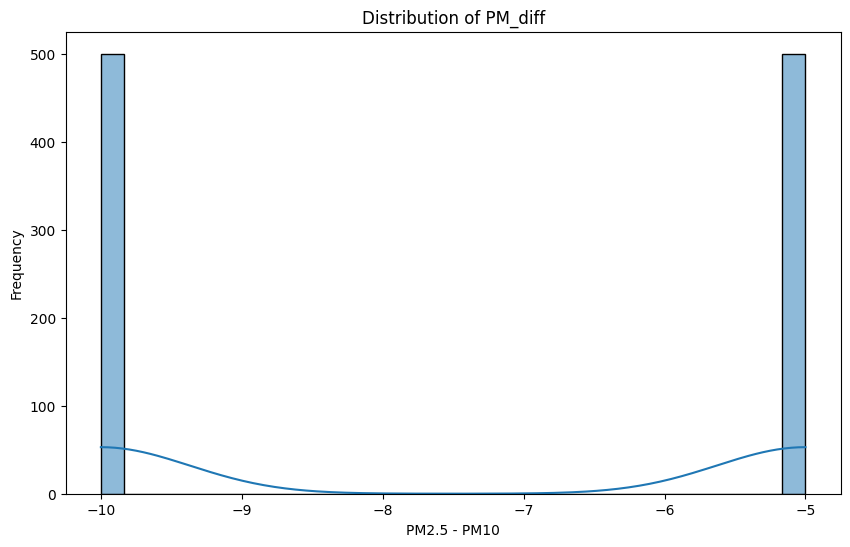

<Figure size 1200x800 with 0 Axes>

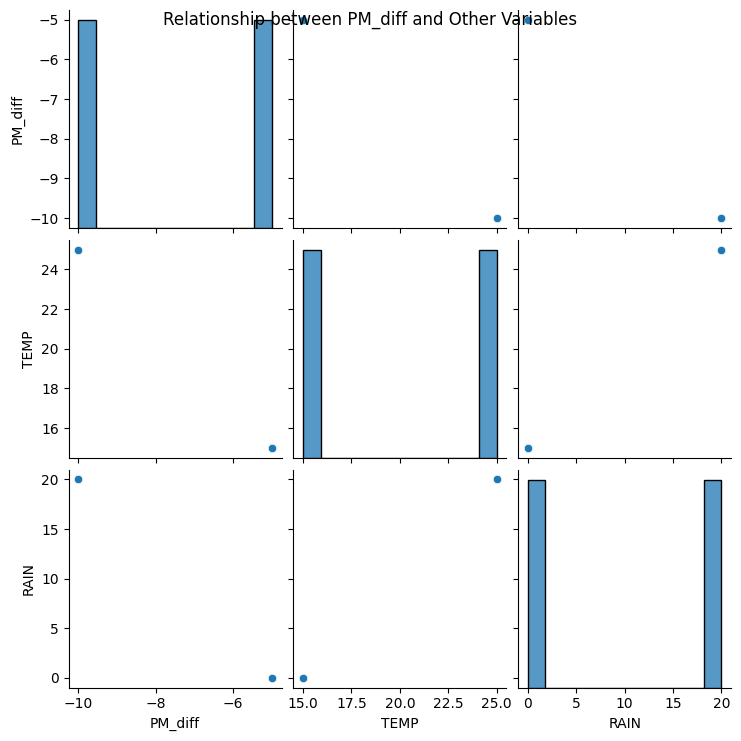

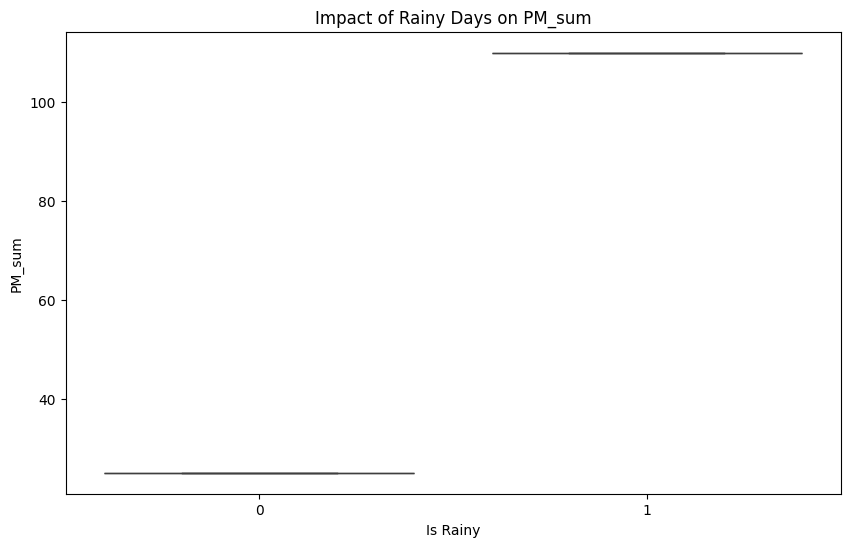

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Distribution of PM_diff
plt.figure(figsize=(10, 6))
sns.histplot(df['PM_diff'], bins=30, kde=True)
plt.title('Distribution of PM_diff')
plt.xlabel('PM2.5 - PM10')
plt.ylabel('Frequency')
plt.show()

# Relationship between PM_diff and other variables
plt.figure(figsize=(12, 8))
sns.pairplot(df[['PM_diff', 'TEMP', 'RAIN']], kind='scatter')
plt.suptitle('Relationship between PM_diff and Other Variables')
plt.show()

# Impact of rainy days on air quality
plt.figure(figsize=(10, 6))
sns.boxplot(x='is_rainy', y='PM_sum', data=df)
plt.title('Impact of Rainy Days on PM_sum')
plt.xlabel('Is Rainy')
plt.ylabel('PM_sum')
plt.show()


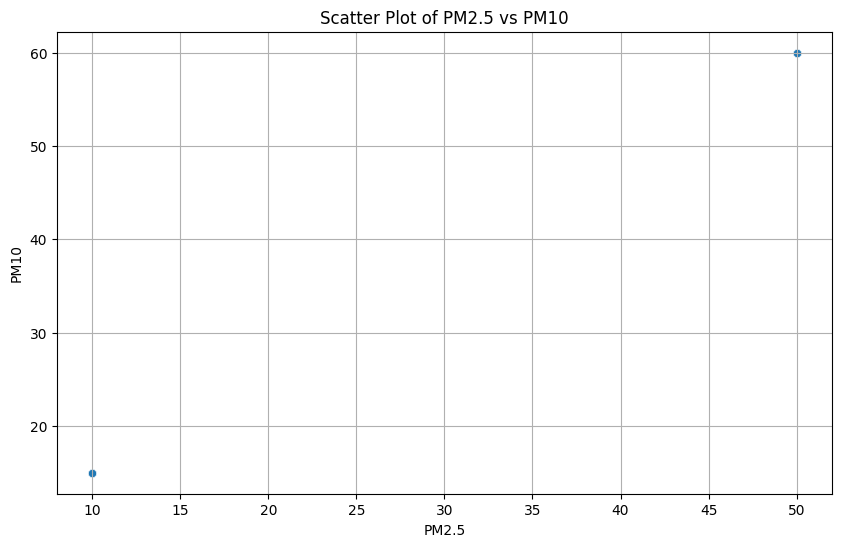

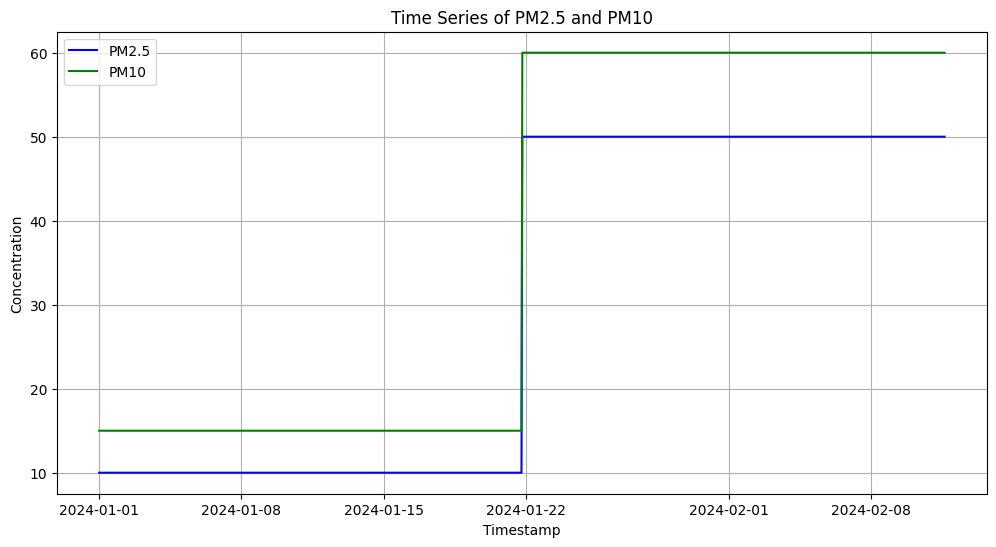

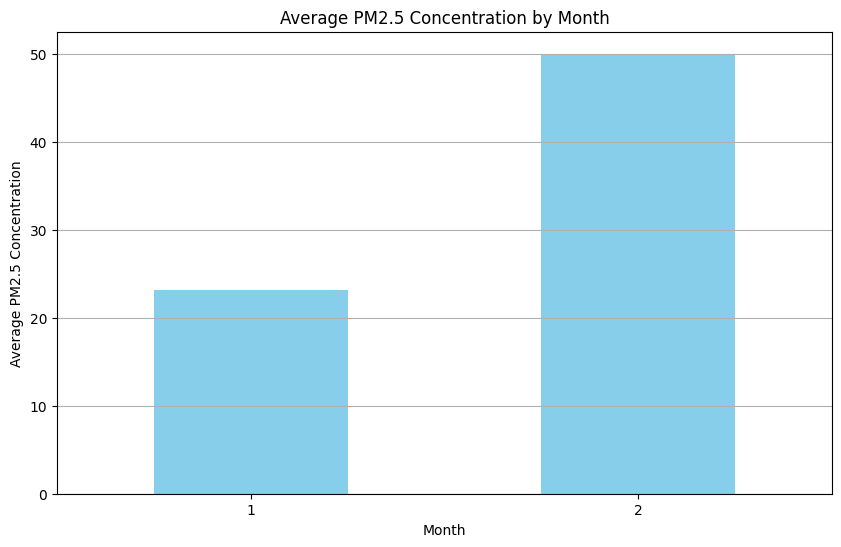

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import folium

# Scatter plot: PM2.5 vs PM10
plt.figure(figsize=(10, 6))
sns.scatterplot(x='PM2.5', y='PM10', data=df)
plt.title('Scatter Plot of PM2.5 vs PM10')
plt.xlabel('PM2.5')
plt.ylabel('PM10')
plt.grid(True)
plt.show()

# Line plot: Time series of PM2.5 and PM10
plt.figure(figsize=(12, 6))
plt.plot(df['timestamp'], df['PM2.5'], label='PM2.5', color='blue')
plt.plot(df['timestamp'], df['PM10'], label='PM10', color='green')
plt.title('Time Series of PM2.5 and PM10')
plt.xlabel('Timestamp')
plt.ylabel('Concentration')
plt.legend()
plt.grid(True)
plt.show()

# Bar chart: Average PM2.5 concentration by month
df['month'] = df['timestamp'].dt.month
average_PM25_by_month = df.groupby('month')['PM2.5'].mean()
plt.figure(figsize=(10, 6))
average_PM25_by_month.plot(kind='bar', color='skyblue')
plt.title('Average PM2.5 Concentration by Month')
plt.xlabel('Month')
plt.ylabel('Average PM2.5 Concentration')
plt.xticks(rotation=0)
plt.grid(axis='y')
plt.show()


In [ ]:
#Anomaly Detection

In [ ]:
df_0

,PM2.5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,wd,WSPM
timestamp,,,,,,,,,,,,
2013-03-01 00:00:00,6.0,6.0,4.0,8.0,300.0,81.0,-0.5,1024.5,-21.4,0.0,NNW,5.7
2013-03-01 01:00:00,6.0,29.0,5.0,9.0,300.0,80.0,-0.7,1025.1,-22.1,0.0,NW,3.9
2013-03-01 02:00:00,6.0,6.0,4.0,12.0,300.0,75.0,-1.2,1025.3,-24.6,0.0,NNW,5.3
2013-03-01 03:00:00,6.0,6.0,4.0,12.0,300.0,74.0,-1.4,1026.2,-25.5,0.0,N,4.9
2013-03-01 04:00:00,5.0,5.0,7.0,15.0,400.0,70.0,-1.9,1027.1,-24.5,0.0,NNW,3.2
...,...,...,...,...,...,...,...,...,...,...,...,...
2017-02-28 15:00:00,9.0,9.0,2.0,22.0,300.0,91.0,15.4,1013.0,-15.0,0.0,NNW,3.3
2017-02-28 16:00:00,10.0,29.0,3.0,21.0,300.0,94.0,14.9,1012.6,-15.4,0.0,NW,2.1
2017-02-28 21:00:00,18.0,32.0,4.0,48.0,500.0,48.0,10.8,1014.2,-13.3,0.0,NW,1.1


In [ ]:
import pandas as pd
from sklearn.ensemble import IsolationForest
df = df_0
# Convert categorical variables to numerical format if necessary
# For example, you can use one-hot encoding for wind direction 'wd'

# Select relevant features for anomaly detection
features = ['PM2.5', 'PM10', 'SO2', 'NO2', 'CO', 'O3', 'TEMP', 'PRES', 'DEWP', 'RAIN', 'WSPM']

# Train Isolation Forest model
model = IsolationForest(contamination=0.05)  # Contamination parameter defines the proportion of anomalies expected
model.fit(df[features])

# Predict anomalies
anomaly_scores = model.decision_function(df[features])
df['anomaly_score'] = anomaly_scores

# Visualize anomalies
threshold = df['anomaly_score'].quantile(0.95)  # Adjust the threshold based on the desired contamination level
anomalies = df[df['anomaly_score'] > threshold]
print("Detected anomalies:")
print(anomalies)


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


Detected anomalies:
       PM2.5   PM10   SO2   NO2      CO    O3  TEMP    PRES  DEWP  RAIN   wd  \
436     46.0   59.0  15.0  44.0   900.0  32.0   5.0  1009.0  -1.7   0.0   NE   
468     72.0   78.0  11.0  60.0  1100.0  28.0   2.9  1016.0  -4.1   0.0    S   
469     86.0   86.0  12.0  70.0  1200.0  18.0   2.7  1015.2  -4.1   0.0  SSE   
470     88.0   95.0  12.0  74.0  1300.0  12.0   2.7  1014.2  -4.1   0.0  SSW   
478     76.0   77.0   3.0  49.0  1100.0   4.0   0.9  1008.9  -4.5   0.0  ESE   
...      ...    ...   ...   ...     ...   ...   ...     ...   ...   ...  ...   
31293   95.0  111.0  22.0  76.0  1400.0  26.0  10.1  1011.0  -5.1   0.0  ENE   
31294   55.0  101.0  18.0  63.0   900.0  30.0   8.5  1011.6  -5.0   0.0  ENE   
31303  120.0  120.0   3.0  55.0  1700.0   4.0   3.5  1016.8  -3.3   0.0   SE   
33257   47.0  106.0   9.0  39.0   700.0  87.0  13.8  1013.8  -9.5   0.0   SW   
33258   43.0   59.0  10.0  50.0   800.0  50.0  11.5  1014.1  -8.4   0.0  SSW   

       WSPM        

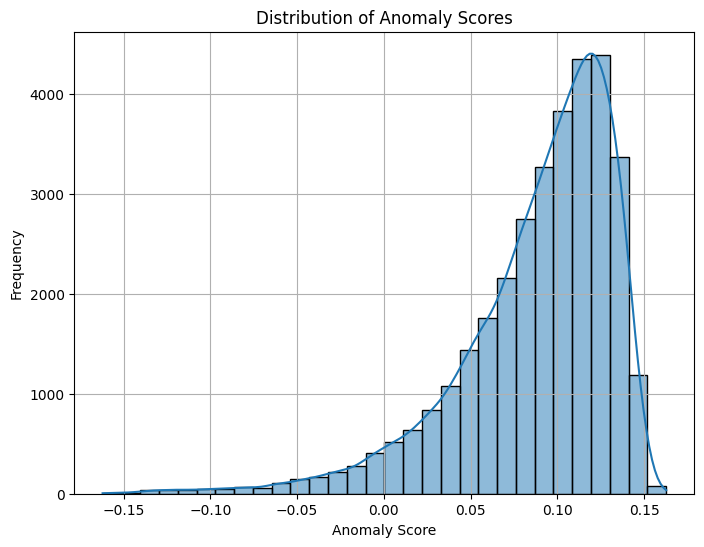

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Distribution of anomaly scores
plt.figure(figsize=(8, 6))
sns.histplot(df['anomaly_score'], bins=30, kde=True)
plt.title('Distribution of Anomaly Scores')
plt.xlabel('Anomaly Score')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()


In [ ]:
df.columns

Index(['PM2.5', 'PM10', 'SO2', 'NO2', 'CO', 'O3', 'TEMP', 'PRES', 'DEWP',
       'RAIN', 'wd', 'WSPM', 'timestamp', 'anomaly_score'],
      dtype='object')

In [ ]:
# import pandas as pd
# df = df_0
# # Convert 'anomaly_score' column to numeric format
# df['anomaly_score'] = pd.to_numeric(df['anomaly_score'], errors='coerce')

# # Correlation with other variables
# # correlation_with_anomaly = df.corrwith(df['anomaly_score'])
# # print("Correlation of other variables with anomaly score:")
# # print(correlation_with_anomaly)

# # Feature importance
# feature_importance = model.feature_importances_
# feature_importance_df = pd.DataFrame({'Feature': features, 'Importance': feature_importance}).sort_values(by='Importance', ascending=False)
# print("Feature Importance:")
# print(feature_importance_df)

# # Anomaly characteristics (e.g., duration, magnitude)
# anomalies = df[df['anomaly_score'] > threshold]
# anomaly_characteristics = anomalies.describe()
# print("Anomaly Characteristics:")
# print(anomaly_characteristics)


AttributeError: 'IsolationForest' object has no attribute 'feature_importances_'

In [ ]:
from sklearn.metrics import mean_absolute_error
from sklearn.inspection import permutation_importance
# Calculate permutation importance
perm_importance = permutation_importance(model, df[features], df['anomaly_score'], scoring='neg_mean_absolute_error', n_repeats=30, random_state=0)

# Extract feature importance scores
feature_importance = perm_importance.importances_mean

# Create a DataFrame to display feature importance
feature_importance_df = pd.DataFrame({'Feature': features, 'Importance': feature_importance}).sort_values(by='Importance', ascending=False)
print("Feature Importance:")
print(feature_importance_df)


Feature Importance:
   Feature  Importance
2      SO2    0.002137
1     PM10    0.001550
5       O3    0.001494
10    WSPM    0.001298
4       CO    0.001272
9     RAIN    0.000789
0    PM2.5    0.000576
3      NO2    0.000494
6     TEMP    0.000362
7     PRES    0.000354
8     DEWP    0.000249


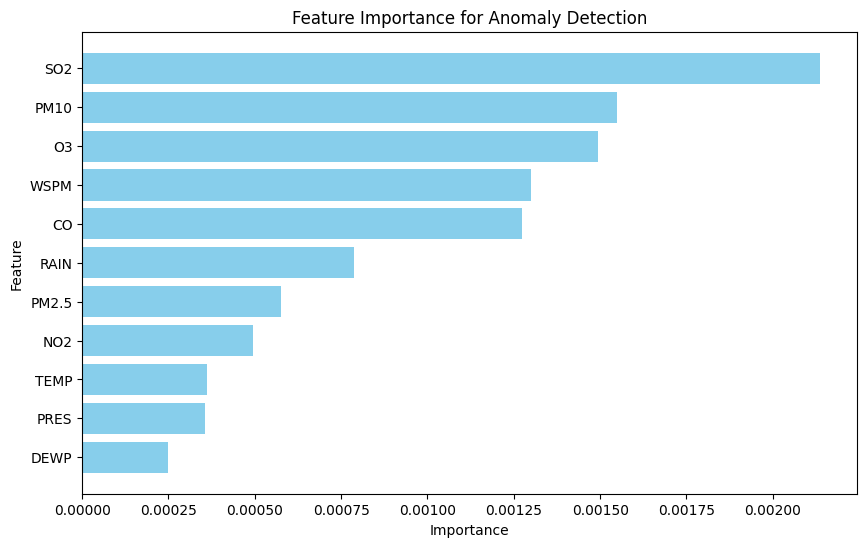

In [ ]:
import matplotlib.pyplot as plt

# Plot feature importance
plt.figure(figsize=(10, 6))
plt.barh(feature_importance_df['Feature'], feature_importance_df['Importance'], color='skyblue')
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.title('Feature Importance for Anomaly Detection')
plt.gca().invert_yaxis()  # Invert y-axis to display features with highest importance on top
plt.show()


In [ ]:
#Feature Importance using random forest

In [ ]:
df = df_0

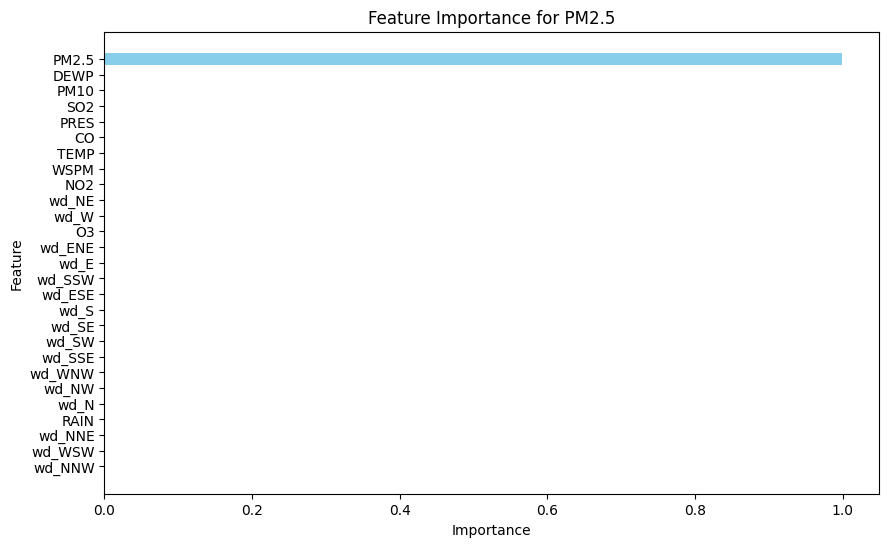

In [ ]:
# Convert categorical variables to numerical format if necessary
# For example, you can use one-hot encoding for wind direction 'wd'

from sklearn.ensemble import RandomForestRegressor

df = pd.get_dummies(df, columns=['wd'])

# Define features and target variable
features = ['PM2.5', 'PM10', 'SO2', 'NO2', 'CO', 'O3', 'TEMP', 'PRES', 'DEWP', 'RAIN', 'WSPM'] + [col for col in df.columns if 'wd_' in col]
target = 'PM2.5'  # Change this to the target variable you want to predict feature importance for

# Train Random Forest model
model = RandomForestRegressor(n_estimators=100, random_state=42)
model.fit(df[features], df[target])

# Get feature importances from the trained model
importances = model.feature_importances_

# Create a DataFrame to store feature importances
feature_importance_df = pd.DataFrame({'Feature': features, 'Importance': importances})

# Sort the DataFrame by importance values in descending order
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)

# Plot feature importances
plt.figure(figsize=(10, 6))
plt.barh(feature_importance_df['Feature'], feature_importance_df['Importance'], color='skyblue')
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.title('Feature Importance for ' + target)
plt.gca().invert_yaxis()  # Invert y-axis to display features with highest importance on top
plt.show()

In [ ]:
feature_importance_df

,Feature,Importance
0,PM2.5,9.997150e-01
8,DEWP,8.288645e-05
1,PM10,7.080650e-05
2,SO2,3.527312e-05
7,PRES,3.143139e-05
4,CO,2.930878e-05
6,TEMP,1.801347e-05
10,WSPM,9.961918e-06
3,NO2,3.450258e-06
15,wd_NE,9.904478e-07


In [ ]:
#Feature Importance using gradient boost

In [ ]:
df = df_0

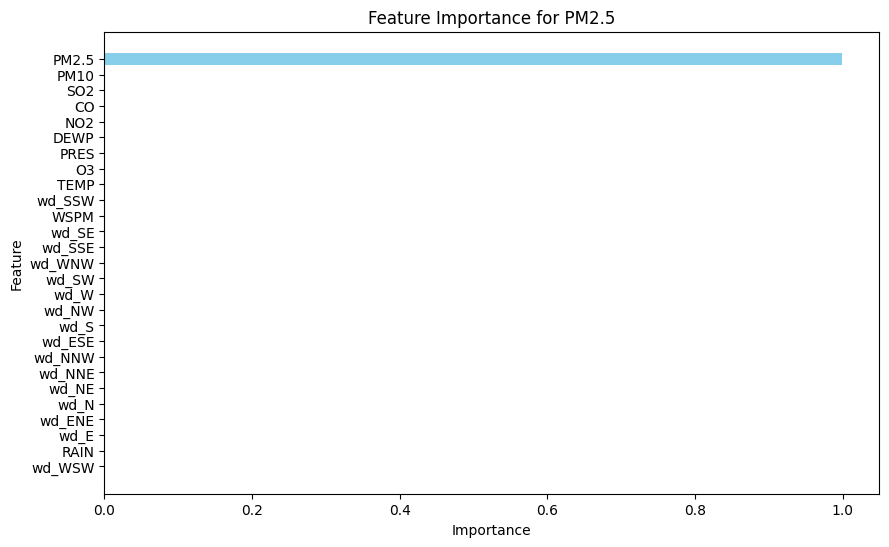

In [ ]:
# Convert categorical variables to numerical format if necessary
# For example, you can use one-hot encoding for wind direction 'wd'
from sklearn.ensemble import GradientBoostingRegressor

df = pd.get_dummies(df, columns=['wd'])

# Define features and target variable
features = ['PM2.5', 'PM10', 'SO2', 'NO2', 'CO', 'O3', 'TEMP', 'PRES', 'DEWP', 'RAIN', 'WSPM'] + [col for col in df.columns if 'wd_' in col]
target = 'PM2.5'  # Change this to the target variable you want to predict feature importance for

# Train Gradient Boosting model
model = GradientBoostingRegressor(n_estimators=100, random_state=42)
model.fit(df[features], df[target])

# Get feature importances from the trained model
importances = model.feature_importances_

# Create a DataFrame to store feature importances
feature_importance_df = pd.DataFrame({'Feature': features, 'Importance': importances})

# Sort the DataFrame by importance values in descending order
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)

# Plot feature importances
plt.figure(figsize=(10, 6))
plt.barh(feature_importance_df['Feature'], feature_importance_df['Importance'], color='skyblue')
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.title('Feature Importance for ' + target)
plt.gca().invert_yaxis()  # Invert y-axis to display features with highest importance on top
plt.show()

In [ ]:
feature_importance_df

,Feature,Importance
0,PM2.5,9.999703e-01
1,PM10,2.015741e-05
2,SO2,6.006729e-06
4,CO,2.052618e-06
3,NO2,6.434518e-07
8,DEWP,4.391958e-07
7,PRES,1.300077e-07
5,O3,8.347880e-08
6,TEMP,6.895775e-08
22,wd_SSW,6.226860e-08


In [ ]:
#Clustering

In [ ]:
df = df_0

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:8

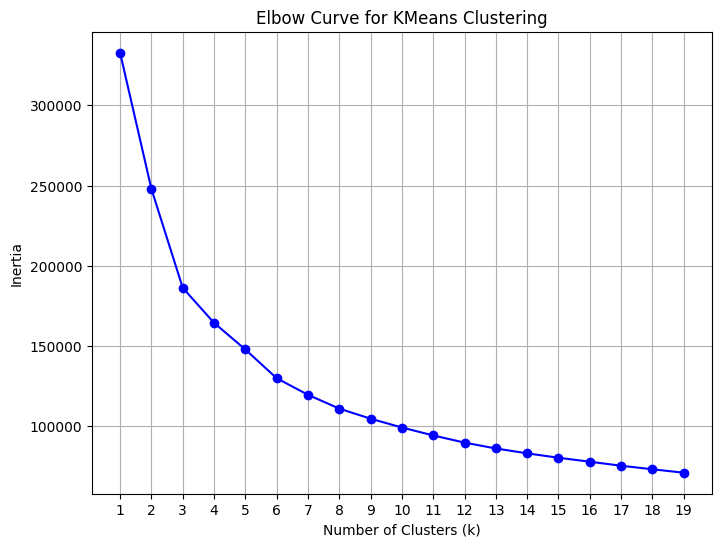

In [ ]:
# Define features for clustering
features = ['PM2.5', 'PM10', 'SO2', 'NO2', 'CO', 'O3', 'TEMP', 'PRES', 'DEWP', 'RAIN']

# Normalize the feature values
normalized_df = (df[features] - df[features].mean()) / df[features].std()

# Choose the range of k values
k_range = range(1, 20)

# Calculate inertia for different values of k
inertia = []
for k in k_range:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(normalized_df)
    inertia.append(kmeans.inertia_)

# Plot the elbow curve
plt.figure(figsize=(8, 6))
plt.plot(k_range, inertia, marker='o', linestyle='-', color='b')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Inertia')
plt.title('Elbow Curve for KMeans Clustering')
plt.xticks(k_range)
plt.grid(True)
plt.show()

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


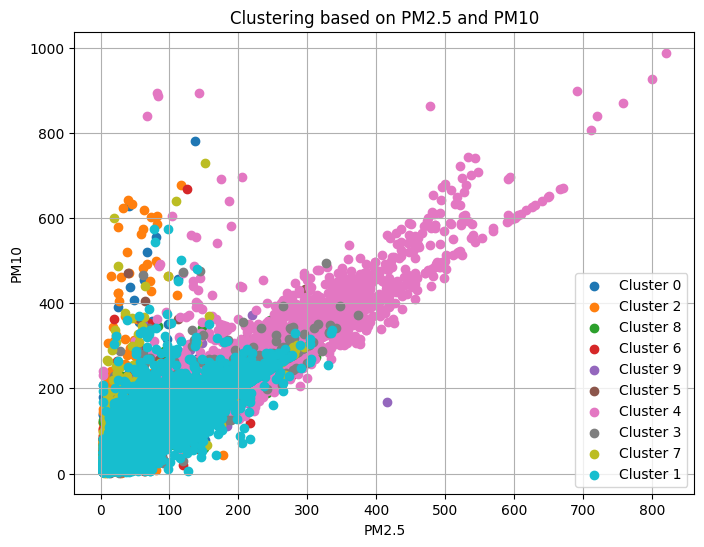

In [ ]:
from sklearn.cluster import KMeans
# Convert categorical variables to numerical format if necessary
# For example, you can use one-hot encoding for wind direction 'wd'
df = df_0
df = pd.get_dummies(df, columns=['wd'])

# Define features for clustering
features = ['PM2.5', 'PM10', 'SO2', 'NO2', 'CO', 'O3', 'TEMP', 'PRES', 'DEWP', 'RAIN', 'WSPM'] + [col for col in df.columns if 'wd_' in col]

# Normalize the feature values
normalized_df = (df[features] - df[features].mean()) / df[features].std()

# Choose the number of clusters (k) using elbow method or any other suitable method
k = 10  # Example: Number of clusters

# Train KMeans model
kmeans = KMeans(n_clusters=k, random_state=42)
kmeans.fit(normalized_df)

# Add cluster labels to the DataFrame
df['cluster'] = kmeans.labels_

# Plot clusters based on two features (e.g., PM2.5 and PM10)
plt.figure(figsize=(8, 6))
for cluster in df['cluster'].unique():
    plt.scatter(df[df['cluster'] == cluster]['PM2.5'], df[df['cluster'] == cluster]['PM10'], label=f'Cluster {cluster}')
plt.xlabel('PM2.5')
plt.ylabel('PM10')
plt.title('Clustering based on PM2.5 and PM10')
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
#dimensitnality reduction

In [ ]:
df_0

,PM2.5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,wd,WSPM,timestamp
0,6.0,6.0,4.0,8.0,300.0,81.0,-0.5,1024.5,-21.4,0.0,NNW,5.7,2013-03-01 00:00:00
1,6.0,29.0,5.0,9.0,300.0,80.0,-0.7,1025.1,-22.1,0.0,NW,3.9,2013-03-01 01:00:00
2,6.0,6.0,4.0,12.0,300.0,75.0,-1.2,1025.3,-24.6,0.0,NNW,5.3,2013-03-01 02:00:00
3,6.0,6.0,4.0,12.0,300.0,74.0,-1.4,1026.2,-25.5,0.0,N,4.9,2013-03-01 03:00:00
4,5.0,5.0,7.0,15.0,400.0,70.0,-1.9,1027.1,-24.5,0.0,NNW,3.2,2013-03-01 04:00:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...
33278,9.0,9.0,2.0,22.0,300.0,91.0,15.4,1013.0,-15.0,0.0,NNW,3.3,2017-02-28 15:00:00
33279,10.0,29.0,3.0,21.0,300.0,94.0,14.9,1012.6,-15.4,0.0,NW,2.1,2017-02-28 16:00:00
33280,18.0,32.0,4.0,48.0,500.0,48.0,10.8,1014.2,-13.3,0.0,NW,1.1,2017-02-28 21:00:00
33281,15.0,42.0,5.0,52.0,600.0,44.0,10.5,1014.4,-12.9,0.0,NNW,1.2,2017-02-28 22:00:00


In [ ]:
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

# Assuming df is your DataFrame containing the dataset
# Replace this with your actual DataFrame

# Select relevant features for PCA
features = ['PM2.5', 'PM10', 'SO2', 'NO2', 'CO', 'O3', 'TEMP', 'PRES', 'DEWP', 'RAIN', 'WSPM']

# Standardize the features
scaler = StandardScaler()
df_scaled = scaler.fit_transform(df[features])

# Apply PCA
pca = PCA()
df_pca = pca.fit_transform(df_scaled)

# Create a DataFrame for the principal components
df_pca = pd.DataFrame(data=df_pca, columns=[f'PC{i}' for i in range(1, len(features) + 1)])

# Explained variance ratio
explained_variance_ratio = pca.explained_variance_ratio_
print("Explained Variance Ratio:")
print(explained_variance_ratio)

# Cumulative explained variance
cumulative_explained_variance = explained_variance_ratio.cumsum()
print("Cumulative Explained Variance:")
print(cumulative_explained_variance)


Explained Variance Ratio:
[0.36642742 0.24592992 0.1160519  0.09073576 0.06128782 0.04452774
 0.02256556 0.02085963 0.01802444 0.00810457 0.00548524]
Cumulative Explained Variance:
[0.36642742 0.61235734 0.72840924 0.819145   0.88043282 0.92496056
 0.94752612 0.96838575 0.98641019 0.99451476 1.        ]


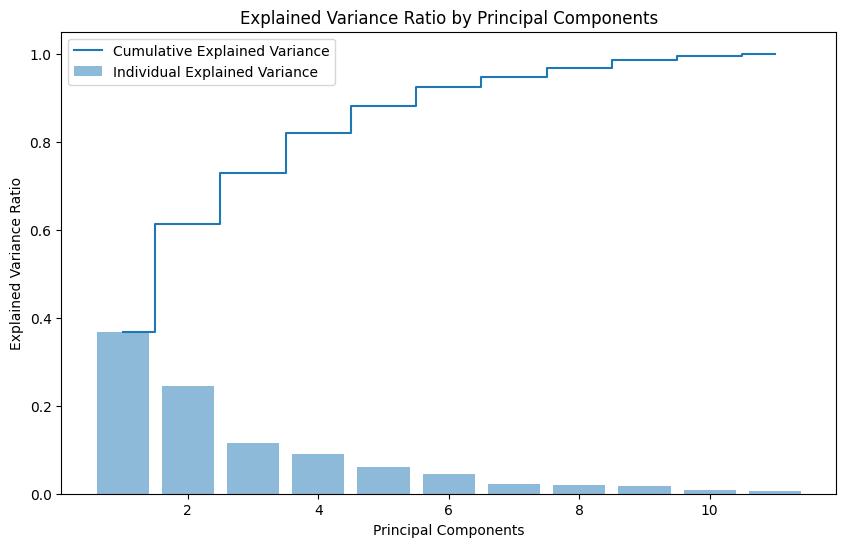

Number of principal components to retain: 6


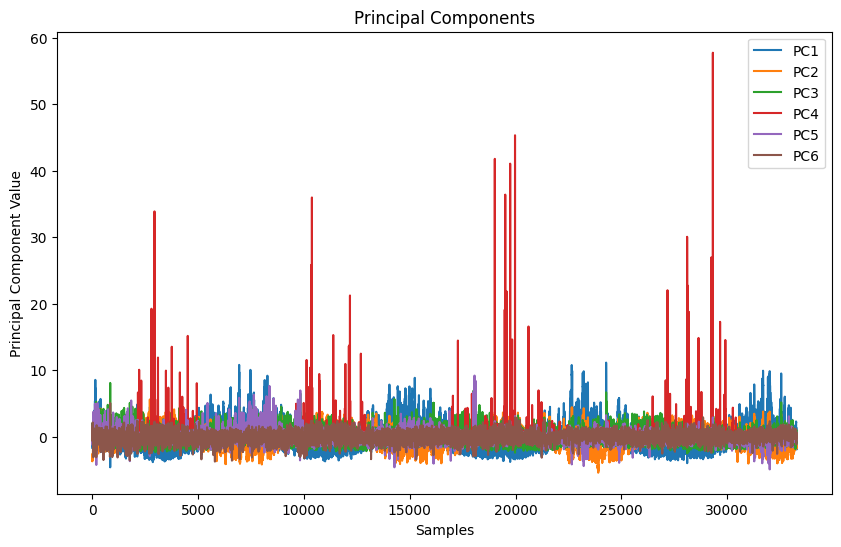

Loadings of Original Features on Principal Components:
            PC1       PC2       PC3       PC4       PC5       PC6
PM2.5  0.391927  0.291639  0.161480  0.024807 -0.243997  0.151335
PM10   0.369712  0.276409  0.251456  0.015649 -0.304098  0.051839
SO2    0.265742  0.030421  0.437454 -0.009568  0.813844 -0.139121
NO2    0.424461  0.118385 -0.146283 -0.016378  0.074896 -0.355086
CO     0.421419  0.175034  0.052021  0.038299 -0.152149  0.105974
O3    -0.284800  0.199793  0.516151 -0.027808  0.026255  0.596316
TEMP  -0.302736  0.450678  0.035501 -0.056947  0.071270 -0.161828
PRES   0.218256 -0.487677  0.002942  0.016956 -0.058125  0.296150
DEWP  -0.159600  0.522006 -0.226942 -0.002175  0.011695 -0.090669
RAIN  -0.034392  0.043026 -0.049619  0.992136  0.067205  0.040866
WSPM  -0.185136 -0.194340  0.611210  0.093120 -0.378270 -0.581689


In [ ]:
import numpy as np

# Visualize explained variance ratio
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
plt.bar(range(1, len(explained_variance_ratio) + 1), explained_variance_ratio, alpha=0.5, align='center', label='Individual Explained Variance')
plt.step(range(1, len(explained_variance_ratio) + 1), cumulative_explained_variance, where='mid', label='Cumulative Explained Variance')
plt.xlabel('Principal Components')
plt.ylabel('Explained Variance Ratio')
plt.title('Explained Variance Ratio by Principal Components')
plt.legend()
plt.show()

# Determine the number of principal components to retain
# You can choose a threshold for cumulative explained variance
# For example, you may decide to retain components that explain 90% of the variance
n_components_to_retain = np.argmax(cumulative_explained_variance >= 0.9) + 1
print(f"Number of principal components to retain: {n_components_to_retain}")

# Visualize principal components
plt.figure(figsize=(10, 6))
for i in range(n_components_to_retain):
    plt.plot(df_pca[f'PC{i+1}'], label=f'PC{i+1}')
plt.xlabel('Samples')
plt.ylabel('Principal Component Value')
plt.title('Principal Components')
plt.legend()
plt.show()

# Investigate the relationship between original features and principal components
# You can examine the loadings of each original feature on the principal components
# Investigate the relationship between original features and principal components
# You can examine the loadings of each original feature on the principal components
loadings = pca.components_
loadings_df = pd.DataFrame(loadings.T[:, :n_components_to_retain], columns=[f'PC{i+1}' for i in range(n_components_to_retain)], index=features)
print("Loadings of Original Features on Principal Components:")
print(loadings_df)

